# Análisis de la comunicación política en Twitter durante 2020

# 0. Introducción

Este notebook pretende ser un análisis exploratorio de la comunicación política en Twitter de los cinco principales partidos a nivel nacional, analizando sus similitudes y diferencias entre grupos, el perfil comunicativo de cada uno de los grupos, y si ha habido diferencias o cambios conforme la pandemia del COVID-19 ha ido evolucionando. Para ello, se analizan más de 130.000 tweets comprendidos desde el 1 de enero de 2020 hasta el 21 de octubre del mismo año, que han sido recopilados mediante la API de Twitter y la librería Tweepy. También se ha recopilado información relativa al sexo y edad de cada diputado mediante un scraping con BeautifulSoup a la web del Congreso.

El análisis consta de 3 fases:
1. Tratamiento de los datos
2. Análisis cuantitativo de los datos: ¿Cómo twittean?
3. Análisis cualitativo: ¿Qué twittean?
4. Breves conclusiones

Los tweets pertenecen a 273 diputados, entre los que se encuentran los líderes de cada uno de los partidos y están repartidos de la siguiente forma:

In [1260]:
tweetsdip.groupby('LISTA').count()[['ID']].rename(columns={'ID': 'Número de tweets'})

,Número de tweets
LISTA,
Ciudadanos,7280
PP,28195
PSOE,44461
Unidas Podemos,18831
Vox,31640


El dataframe original contiene 29 columnas:
- ID: Id identificativo de cada tweet
- CREATED_AT: Fecha de creación del tweet
- FULL_TEXT: Texto del tweet
- IS_QUOTE: Indica si el tweet es una cita en retweet de otro
- RETWEET_COUNT: Número de retweets
- FAVORITE_COUNT: Número de likes
- POSSIBLE_SENSITIVE: Indica si está categorizado como potencialmente sensible
- IN_REPLY_TO_STATUS_ID: Si es en respuesta a otro tweet, su ID
- IN_REPLY_TO_USER_ID: Si es en respuesta a otro usuario, su ID
- IN_REPLY_TO_SCREEN_NAME: Si es en respuesta a otro usuario, su nombre de usuario
- HASHTAGS: Hashtags incluidos en el tweet
- USER_MENTIONS: Menciones
- 'URLS': Urls en el tweet
- 'MEDIA_URL': Url del archivo multimedia asociado, si lo tiene.
- 'USER_ID': ID del usuario
- 'USER_SCREEN_NAME': Nombre de usuario
- 'USER_DESCRIPTION': Biografía del perfil del usuario
- 'USER_FOLLOWERS_COUNT': Número de seguidores
- 'USER_FOLLOWING_COUNT': Número de seguidos
- 'USER_CREATED_AT': Fecha de creación del usuario
- 'USER_TWEET_COUNT': Número de tweets (incluidos RT) del usuario
- 'CREATED_AT_DATE': Fecha de creación del tweet. Formato Y-m-d
- 'CREATED_AT_HOUR': Hora de creación del tweet
- 'LISTA': Grupo político
- 'NOMBRE_APELLIDOS': Nombre y apellidos del diputado
- 'SEXO': Sexo
- 'EDAD': Edad
- 'IS_TOP_TWEET': Indica si el tweet está en el 10% con más retweets
- 'CREATED_AT_DWEEK': Número del día de semana en que se creó el tweet

## 1. Data preprocessing

Para la recopilación de datos se ha escrito un script dentro de otro notebook que será entregado junto a este. En él se detalla la creación de la base de datos con SQLite3, la puesta en funcionamiento del script y la ejecución de este. Por temas de productividad, vamos a cargar directamente la BBDD con la información que hemos recogido, en lugar de ejecutar el script aquí:

### 1. 1. Carga de datos

In [1146]:
import pandas as pd
import sqlite3
import contextlib

from datetime import datetime,date
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from colour import Color

sns.set_style("whitegrid")

import warnings
warnings.filterwarnings('ignore')

Conectamos con la BBDD

In [1147]:
# Conectamos con la base de datos
connection = sqlite3.connect("tweets.db")

# Obtenemos un cursor que utilizaremos para hacer las queries
crsr = connection.cursor()

In [1148]:
# Con esta función leemos los datos y lo pasamos a un DataFrame de Pandas

def sql_query(query):

    # Ejecuta la query
    crsr.execute(query)

    # Almacena los datos de la query 
    ans = crsr.fetchall()

    # Obtenemos los nombres de las columnas de la tabla
    names = [description[0] for description in crsr.description]

    return pd.DataFrame(ans,columns=names)

In [1149]:
query = 'SELECT * FROM tweets_diputados'
df_tweets_diputados = sql_query(query)

In [1150]:
# Decimos a pandas que muestre todas las columnas
pd.set_option('display.max_columns', None)
pd.options.display.float_format = "{:,.2f}".format

# Hacemos un copy de la original para no tener que volver a realizar consulta
tweetsdip = df_tweets_diputados.copy()

tweetsdip.head()

,ID,CREATED_AT,FULL_TEXT,IS_QUOTE,RETWEET_COUNT,FAVORITE_COUNT,POSSIBLE_SENSITIVE,IN_REPLY_TO_STATUS_ID,IN_REPLY_TO_STATUS_ID_STR,IN_REPLY_TO_USER_ID,IN_REPLY_TO_USER_ID_STR,IN_REPLY_TO_SCREEN_NAME,ENTITIES,HASHTAGS,SYMBOLS,USER_MENTIONS,URLS,MEDIA_URL,EXTENDED_ENTITIES,USER,USER_ID,USER_SCREEN_NAME,USER_DESCRIPTION,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_CREATED_AT,USER_TWEET_COUNT,INFO
0,1319175784267976706,2020-10-22 07:16:30,📺En unos minutos seré entrevistado en @LaHoraT...,1,14,28,0.00,nan,None,nan,None,None,"{'hashtags': [], 'symbols': [], 'user_mentions...",[],[],"[{'screen_name': 'LaHoraTVE', 'name': 'La Hora...","[{'url': 'https://t.co/5Frfhxny4Z', 'expanded_...",None,None,User(_api=<tweepy.api.API object at 0x0000025A...,202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13 22:20:57,18527,Status(_api=<tweepy.api.API object at 0x000002...
1,1318920807737937923,2020-10-21 14:23:19,.@sanchezcastejon a Casado:\nLe pido que no re...,0,164,292,0.00,nan,None,nan,None,None,"{'hashtags': [{'text': 'MociónDeCensura', 'ind...","[{'text': 'MociónDeCensura', 'indices': [189, ...",[],"[{'screen_name': 'sanchezcastejon', 'name': 'P...",[],"[{'id': 1318920732173357059, 'id_str': '131892...","{'media': [{'id': 1318920732173357059, 'id_str...",User(_api=<tweepy.api.API object at 0x0000025A...,202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13 22:20:57,18527,Status(_api=<tweepy.api.API object at 0x000002...
2,1318904449784598532,2020-10-21 13:18:19,Usted odia a España tal y como es. A un patrio...,0,449,1044,0.00,nan,None,nan,None,None,"{'hashtags': [{'text': 'EspañaPuedeConVox', 'i...","[{'text': 'EspañaPuedeConVox', 'indices': [244...",[],"[{'screen_name': 'sanchezcastejon', 'name': 'P...",[],"[{'id': 1318903990843772930, 'id_str': '131890...","{'media': [{'id': 1318903990843772930, 'id_str...",User(_api=<tweepy.api.API object at 0x0000025A...,202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13 22:20:57,18527,Status(_api=<tweepy.api.API object at 0x000002...
3,1318878403680858112,2020-10-21 11:34:49,.@sanchezcastejon: La pandemia ha puesto a pru...,0,168,275,0.00,nan,None,nan,None,None,"{'hashtags': [{'text': 'MociónDeCensura', 'ind...","[{'text': 'MociónDeCensura', 'indices': [238, ...",[],"[{'screen_name': 'sanchezcastejon', 'name': 'P...",[],"[{'id': 1318878349960380417, 'id_str': '131887...","{'media': [{'id': 1318878349960380417, 'id_str...",User(_api=<tweepy.api.API object at 0x0000025A...,202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13 22:20:57,18527,Status(_api=<tweepy.api.API object at 0x000002...
4,1318819292087988224,2020-10-21 07:39:56,Hoy salen a la venta los billetes de la nueva ...,0,170,464,0.00,nan,None,nan,None,None,"{'hashtags': [], 'symbols': [], 'user_mentions...",[],[],[],[],"[{'id': 1318819280385986560, 'id_str': '131881...","{'media': [{'id': 1318819280385986560, 'id_str...",User(_api=<tweepy.api.API object at 0x0000025A...,202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13 22:20:57,18527,Status(_api=<tweepy.api.API object at 0x000002...


Tenemos el dataframe cargado, ahora inspeccionamos cada una de las columnas y transformamos la data para poder operar con ella:

In [1151]:
tweetsdip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130407 entries, 0 to 130406
Data columns (total 28 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   ID                         130407 non-null  int64  
 1   CREATED_AT                 130407 non-null  object 
 2   FULL_TEXT                  130407 non-null  object 
 3   IS_QUOTE                   130407 non-null  int64  
 4   RETWEET_COUNT              130407 non-null  int64  
 5   FAVORITE_COUNT             130407 non-null  int64  
 6   POSSIBLE_SENSITIVE         90292 non-null   float64
 7   IN_REPLY_TO_STATUS_ID      34225 non-null   float64
 8   IN_REPLY_TO_STATUS_ID_STR  34225 non-null   object 
 9   IN_REPLY_TO_USER_ID        36298 non-null   float64
 10  IN_REPLY_TO_USER_ID_STR    36298 non-null   object 
 11  IN_REPLY_TO_SCREEN_NAME    36298 non-null   object 
 12  ENTITIES                   130407 non-null  object 
 13  HASHTAGS                   13

### 1. 2. Preparación de los datos

#### a. Eliminando columnas innecesarias

Tenemos una serie de columnas que debemos de eliminar ya que no van a servirnos para realizar los análisis exploratorios. Algunas de ellas por la redundancia que suponen con otras *(USER o INFO contienen la información agregada de otras columnas)*, o por el nulo valor que pueden aportar al análisis *(circunscripción)*. La columna 'SYMBOLS', aunque contiene valores, son en todos los casos una lista vacía, por lo que la eliminamos también.

In [1152]:
tweetsdip.head(1)

,ID,CREATED_AT,FULL_TEXT,IS_QUOTE,RETWEET_COUNT,FAVORITE_COUNT,POSSIBLE_SENSITIVE,IN_REPLY_TO_STATUS_ID,IN_REPLY_TO_STATUS_ID_STR,IN_REPLY_TO_USER_ID,IN_REPLY_TO_USER_ID_STR,IN_REPLY_TO_SCREEN_NAME,ENTITIES,HASHTAGS,SYMBOLS,USER_MENTIONS,URLS,MEDIA_URL,EXTENDED_ENTITIES,USER,USER_ID,USER_SCREEN_NAME,USER_DESCRIPTION,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_CREATED_AT,USER_TWEET_COUNT,INFO
0,1319175784267976706,2020-10-22 07:16:30,📺En unos minutos seré entrevistado en @LaHoraT...,1,14,28,0.00,nan,None,nan,None,None,"{'hashtags': [], 'symbols': [], 'user_mentions...",[],[],"[{'screen_name': 'LaHoraTVE', 'name': 'La Hora...","[{'url': 'https://t.co/5Frfhxny4Z', 'expanded_...",None,None,User(_api=<tweepy.api.API object at 0x0000025A...,202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13 22:20:57,18527,Status(_api=<tweepy.api.API object at 0x000002...


In [1153]:
# ELIMINAMOS COLUMNAS DEL DF
tweetsdip.drop(['IN_REPLY_TO_STATUS_ID_STR',
               'IN_REPLY_TO_USER_ID_STR',
               'ENTITIES',
               'SYMBOLS',
               'EXTENDED_ENTITIES',
               'USER',
               'INFO'], axis=1, inplace=True)

#### b. Modificando columnas

Vamos a darle formato a las columnas. Primero, vamos a desglosar la columna *CREATED_AT* en dos: *CREATED_AT_DATE* y *CREATED_AT_TIME* separando así la fecha y hora de creación del tweet. También vamos a modificar la columna *USER_CREATED_AT* y vamos a simplificarla sólamente con la información del día. También vamos a convertir las columnas con IDs de cualquier tipo en *object*, ya que no nos interesa operar con ellas como si de números se tratase, y transformaremos la columna *POSSIBLE_SENSITIVE* e *IS_QUOTE* en booleana.

In [1154]:
tweetsdip['CREATED_AT_DATE'] = tweetsdip['CREATED_AT'].apply(lambda x: x.split()[0]).astype('datetime64')
tweetsdip['CREATED_AT_HOUR'] = pd.to_timedelta(tweetsdip['CREATED_AT'].apply(lambda x: x.split()[1]))
tweetsdip['USER_CREATED_AT'] = tweetsdip['USER_CREATED_AT'].apply(lambda x: x.split()[0]).astype('datetime64')



In [1155]:
# Convertimos a boolean POSSIBLE_SENSITIVE y IS_QUOTE
tweetsdip['POSSIBLE_SENSITIVE'] = np.where(tweetsdip['POSSIBLE_SENSITIVE']==1, True, False)
tweetsdip['POSSIBLE_SENSITIVE'] = tweetsdip['POSSIBLE_SENSITIVE'].astype('boolean')

tweetsdip['IS_QUOTE'] = np.where(tweetsdip['IS_QUOTE']==1, True, False)
tweetsdip['IS_QUOTE'] = tweetsdip['IS_QUOTE'].astype('boolean')

# Cambiamos el tipo de columnas de IDs
tweetsdip['ID'] = tweetsdip['ID'].astype('str')
tweetsdip['IN_REPLY_TO_STATUS_ID'] = tweetsdip['IN_REPLY_TO_STATUS_ID'].astype('str')
tweetsdip['IN_REPLY_TO_USER_ID'] = tweetsdip['IN_REPLY_TO_USER_ID'].astype('str')
tweetsdip['USER_ID'] = tweetsdip['USER_ID'].astype('str')

In [1156]:
tweetsdip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 130407 entries, 0 to 130406
Data columns (total 23 columns):
 #   Column                   Non-Null Count   Dtype          
---  ------                   --------------   -----          
 0   ID                       130407 non-null  object         
 1   CREATED_AT               130407 non-null  object         
 2   FULL_TEXT                130407 non-null  object         
 3   IS_QUOTE                 130407 non-null  boolean        
 4   RETWEET_COUNT            130407 non-null  int64          
 5   FAVORITE_COUNT           130407 non-null  int64          
 6   POSSIBLE_SENSITIVE       130407 non-null  boolean        
 7   IN_REPLY_TO_STATUS_ID    130407 non-null  object         
 8   IN_REPLY_TO_USER_ID      130407 non-null  object         
 9   IN_REPLY_TO_SCREEN_NAME  36298 non-null   object         
 10  HASHTAGS                 130407 non-null  object         
 11  USER_MENTIONS            130407 non-null  object         
 12  UR

#### c. Agregando información al dataframe

##### Variable Partido político

Agregamos la columna de partido político:

In [1157]:
diputados = pd.read_excel('diputados_twitter.xlsx', sep=';', index_col=0)
diputados = pd.DataFrame(diputados)
diputados.loc[:, 'Twitter'] = diputados['Twitter'].str.split('https://twitter.com/').str[1]
diputados.head()

,Nombre,Apellidos,Lista,Circunscripción,Twitter
0,José Luis,Ábalos Meco,PSOE,Valencia,abalosmeco
1,Santiago,Abascal Conde,Vox,Madrid,Santi_ABASCAL
2,José Luis,Aceves Galindo,PSOE,Segovia,jlaceves
3,Juan José,Aizcorbe Torra,Vox,Barcelona,JuanjoAizcorbe
4,Francisco José,Alcaraz Martos,Vox,Jaén,fjosealcaraz


In [1158]:
# Comprobamos nulls
diputados.isnull().sum()

Nombre              0
Apellidos           0
Lista               0
Circunscripción     0
Twitter            21
dtype: int64

Vemos que 21 de los 305 diputados no tienen cuenta de Twitter. Para evitar problemas a la hora de combinar este dataframe con *tweetsdip*, creamos un subdataframe con aquellos diputados que sí están en la plataforma.

In [1159]:
# Creamos un subdf con los diputados que tienen Twitter
diputados_tw = diputados.copy()
diputados_tw = diputados_tw.dropna()



Tenemos dos dataframes donde el nombre de la cuenta no coincide al 100% en mayúsculas y minúsculas, lo que resulta un problema a la hora de combinar ambos dataframes bajo es key. Por un tema de legibilidad no nos interesa perder la información de las mayúsculas en el nombre de las cuentas de Twitter, así que vamos a duplicar la columna en minúscula dentro de *tweetsdip* para poder matchear ambos dataframes. Después eliminaremos esa columna y nos quedaremos con la original conservando la información.

In [1160]:
# Convertimos a minúscula la columa del primer df
diputados_tw['Twitter'] = diputados_tw['Twitter'].apply(lambda x: x.lower())

# Creamos la columna minúscula en el segundo df
tweetsdip['USER_SCREEN_NAME_MIN'] = tweetsdip['USER_SCREEN_NAME'].apply(lambda x: x.lower())

# Matcheamos ambos dataframes
tweetsdip = pd.merge(tweetsdip, diputados_tw, validate='m:1',
                     left_on = 'USER_SCREEN_NAME_MIN', right_on = 'Twitter',
                     how='inner')

In [1161]:
# Comprobamos dataframe
tweetsdip.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 130407 entries, 0 to 130406
Data columns (total 29 columns):
 #   Column                   Non-Null Count   Dtype          
---  ------                   --------------   -----          
 0   ID                       130407 non-null  object         
 1   CREATED_AT               130407 non-null  object         
 2   FULL_TEXT                130407 non-null  object         
 3   IS_QUOTE                 130407 non-null  boolean        
 4   RETWEET_COUNT            130407 non-null  int64          
 5   FAVORITE_COUNT           130407 non-null  int64          
 6   POSSIBLE_SENSITIVE       130407 non-null  boolean        
 7   IN_REPLY_TO_STATUS_ID    130407 non-null  object         
 8   IN_REPLY_TO_USER_ID      130407 non-null  object         
 9   IN_REPLY_TO_SCREEN_NAME  36298 non-null   object         
 10  HASHTAGS                 130407 non-null  object         
 11  USER_MENTIONS            130407 non-null  object         
 12  UR

Ahora vemos que la información en *tweetsdip* ha quedado intacta, conservando el mismo número de filas pero agregando las columnas del dataframe con los nombres y partidos políticos de cada cuenta.

Para terminar, a la hora de trabajar con estas columnas sería conveniente que todas tuvieran el mismo formato de texto, así que vamos a pasarlas a mayúsculas.

In [1162]:
tweetsdip.columns = tweetsdip.columns.str.upper()

##### Variable Sexo y edad

Hemos realizado scrapping a la web del Congreso para obtener la fecha de nacimiento y sexo de cada uno de los diputados en el congreso. Podríamos haber agregado el sexo manualmente, pero la tarea se habría hecho muy larga ya que contamos con más de 300 registros y bueno, para algo hemos aprendido programación ;)

In [1163]:
diputados_info = pd.read_csv('diputados_info.csv',
                             sep=';',
                             index_col=0,
                             infer_datetime_format=True,
                             parse_dates = ['FECHA_NACIMIENTO'])

diputados_info = pd.DataFrame(diputados_info)

# Leemos dataframe y su info
print(diputados_info.info())

diputados_info.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 376 entries, 0 to 375
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   NOMBRE            376 non-null    object        
 1   APELLIDOS         376 non-null    object        
 2   FECHA_NACIMIENTO  376 non-null    datetime64[ns]
 3   SEXO              376 non-null    object        
dtypes: datetime64[ns](1), object(3)
memory usage: 14.7+ KB
None


,NOMBRE,APELLIDOS,FECHA_NACIMIENTO,SEXO
0,Guillermo Antonio,Meijón Couselo,1958-03-14,Hombre
1,Luis Carlos,Sahuquillo García,1966-11-01,Hombre
2,Mariana de Gracia,Canales Duque,1975-01-11,Mujer
3,Antidio,Fagúndez Campo,1976-02-13,Hombre
4,Francisco José,Salazar Rodríguez,1968-11-24,Hombre


Creamos la columna 'EDAD':

In [1164]:
diputados_info['EDAD'] = diputados_info['FECHA_NACIMIENTO'].apply(lambda x: 2020 - int(x.strftime('%Y')))

diputados_info.head()

,NOMBRE,APELLIDOS,FECHA_NACIMIENTO,SEXO,EDAD
0,Guillermo Antonio,Meijón Couselo,1958-03-14,Hombre,62
1,Luis Carlos,Sahuquillo García,1966-11-01,Hombre,54
2,Mariana de Gracia,Canales Duque,1975-01-11,Mujer,45
3,Antidio,Fagúndez Campo,1976-02-13,Hombre,44
4,Francisco José,Salazar Rodríguez,1968-11-24,Hombre,52


Ahora que ya tenemos las columnas necesarias, podemos combinarlas con nuestro dataframe original sabiendo que en él solo tenemos diputados con cuenta de Twitter.


Queremos combinar dataframes bajo el key de 'APELLIDOS', así que comprobamos si tenemos apellidos duplicados que nos impidan realizar el merge.

In [1165]:
# Agrupamos por apellido y vemos si hay algún apellido que esté más de una vez
set(diputados_info.groupby('APELLIDOS').count()['NOMBRE'])

{1, 2}

In [1166]:
# Comprobamos el apellido duplicado
diputados_info[diputados_info['APELLIDOS'].duplicated()]['APELLIDOS']

326    López Álvarez
Name: APELLIDOS, dtype: object

In [1167]:
# Buscamos apellido
diputados_info.loc[diputados_info['APELLIDOS'] == 'López Álvarez', :]

,NOMBRE,APELLIDOS,FECHA_NACIMIENTO,SEXO,EDAD
60,Patxi,López Álvarez,1959-04-10,Hombre,61
326,María Teresa,López Álvarez,1980-05-14,Mujer,40


El problema es que tenemos dos diputados con el mismo apellido, Patxi López Álvarez y María Teresa López Álvarez. Esto hace que la key no sea única, y por tanto no podrá usarse. Para resolverlo vamos a combinar 'NOMBRE' y 'APELLIDO' bajo el mismo formato en una nueva columna dentro de ambos dataframes y realizamos el merge.

In [1168]:
tweetsdip['NOMBRE_APELLIDOS'] = tweetsdip['NOMBRE'] + ' ' + tweetsdip['APELLIDOS']
diputados_info['NOMBRE_APELLIDOS'] = diputados_info['NOMBRE'] + ' ' + diputados_info['APELLIDOS']

# Eliminamos carácteres escapados de la columna
diputados_info['NOMBRE_APELLIDOS'] = diputados_info['NOMBRE_APELLIDOS'].apply(lambda x: x.replace('\xa0', ""))

# Combinamos dataframe sumando solo columnas necesarias
tweetsdip = tweetsdip.merge(diputados_info[['NOMBRE_APELLIDOS', 'SEXO', 'EDAD']], validate='m:1',
                            left_on = 'NOMBRE_APELLIDOS', right_on = 'NOMBRE_APELLIDOS',
                            how='inner')


In [1169]:
# Volvemos a comprobar la integridad de los datos respecto al df original
tweetsdip.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 130407 entries, 0 to 130406
Data columns (total 32 columns):
 #   Column                   Non-Null Count   Dtype          
---  ------                   --------------   -----          
 0   ID                       130407 non-null  object         
 1   CREATED_AT               130407 non-null  object         
 2   FULL_TEXT                130407 non-null  object         
 3   IS_QUOTE                 130407 non-null  boolean        
 4   RETWEET_COUNT            130407 non-null  int64          
 5   FAVORITE_COUNT           130407 non-null  int64          
 6   POSSIBLE_SENSITIVE       130407 non-null  boolean        
 7   IN_REPLY_TO_STATUS_ID    130407 non-null  object         
 8   IN_REPLY_TO_USER_ID      130407 non-null  object         
 9   IN_REPLY_TO_SCREEN_NAME  36298 non-null   object         
 10  HASHTAGS                 130407 non-null  object         
 11  USER_MENTIONS            130407 non-null  object         
 12  UR

Por último, volvemos a eliminar columnas que ya no nos interesan para nuestro análisis:

In [1170]:
tweetsdip.drop(['CIRCUNSCRIPCIÓN',
                'TWITTER',
                'USER_SCREEN_NAME_MIN',
                'NOMBRE',
                'APELLIDOS'], axis=1, inplace=True)

In [1171]:
# Lista de diputados que no han twitteado o solo han hecho retweets

diputados_sin_tweets = [i for i in diputados['Twitter'] if \
                        (len(tweetsdip.loc[tweetsdip['USER_SCREEN_NAME'] == i, :]) == 0) and \
                        (type(i) == str)]
diputados_sin_tweets

['jlaceves',
 'jangelvillalon',
 'gemma_araujo',
 'AnaBotellaPSOE',
 'JCDuran_',
 'isauralealf',
 'TristanaMg',
 'AuxiPD',
 'JosLuisRamosRo2',
 'albertora_vox',
 'lcsahuquillo',
 'sancho_herminio',
 'dvserrada',
 'yolandaalcaldes']

In [1172]:
tweetsdip.head(2)

,ID,CREATED_AT,FULL_TEXT,IS_QUOTE,RETWEET_COUNT,FAVORITE_COUNT,POSSIBLE_SENSITIVE,IN_REPLY_TO_STATUS_ID,IN_REPLY_TO_USER_ID,IN_REPLY_TO_SCREEN_NAME,HASHTAGS,USER_MENTIONS,URLS,MEDIA_URL,USER_ID,USER_SCREEN_NAME,USER_DESCRIPTION,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_CREATED_AT,USER_TWEET_COUNT,CREATED_AT_DATE,CREATED_AT_HOUR,LISTA,NOMBRE_APELLIDOS,SEXO,EDAD
0,1319175784267976706,2020-10-22 07:16:30,📺En unos minutos seré entrevistado en @LaHoraT...,True,14,28,False,nan,nan,None,[],"[{'screen_name': 'LaHoraTVE', 'name': 'La Hora...","[{'url': 'https://t.co/5Frfhxny4Z', 'expanded_...",None,202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13,18527,2020-10-22,07:16:30,PSOE,José Luis Ábalos Meco,Hombre,61
1,1318920807737937923,2020-10-21 14:23:19,.@sanchezcastejon a Casado:\nLe pido que no re...,False,164,292,False,nan,nan,None,"[{'text': 'MociónDeCensura', 'indices': [189, ...","[{'screen_name': 'sanchezcastejon', 'name': 'P...",[],"[{'id': 1318920732173357059, 'id_str': '131892...",202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13,18527,2020-10-21,14:23:19,PSOE,José Luis Ábalos Meco,Hombre,61


##### Variable 'TOP-TWEET': Calculando top-tweets

Agregamos una columna indicando si un tweet pertenece al top 10 (percentil 90) de todo el dataset:

In [1173]:
for i in np.arange(0,100,10):
    print('Percentil {}:'.format(i), np.percentile(tweetsdip['RETWEET_COUNT'], i))

Percentil 0: 0.0
Percentil 10: 0.0
Percentil 20: 1.0
Percentil 30: 2.0
Percentil 40: 4.0
Percentil 50: 8.0
Percentil 60: 16.0
Percentil 70: 34.0
Percentil 80: 88.0
Percentil 90: 311.0


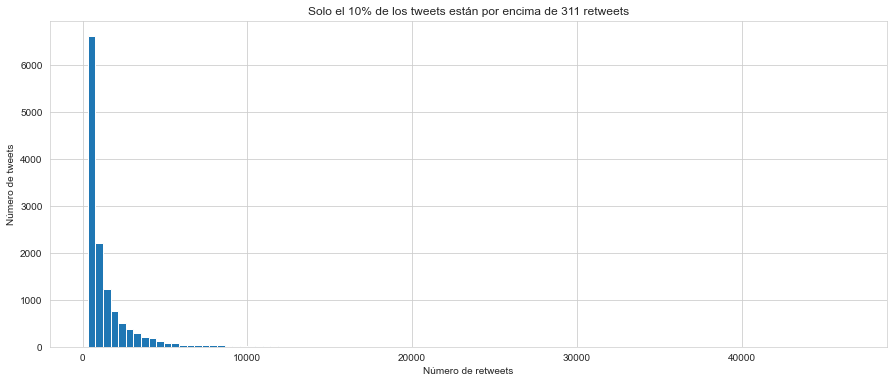

In [1174]:
plt.figure(figsize=(15,6))
tweetsdip['RETWEET_COUNT'][tweetsdip['RETWEET_COUNT']>np.percentile(tweetsdip['RETWEET_COUNT'],90)].hist(bins=100)
plt.xlabel('Número de retweets')
plt.ylabel('Número de tweets')
plt.title('Solo el 10% de los tweets están por encima de 311 retweets');

Podemos observar que solo el 10% de los tweets se encuentran por encima de 311 retweets, lo que indica que la gran mayoría de nuestros tweets tienen poca viralidad y se distribuyen en la parte izquierda del histograma. Esta 'nota de corte' será la que emplearemos para categorizar en 'top-tweet' o no.

## 2. Análisis cuantitativo. ¿Cómo twittea el congreso?

### 2. 1. Volumen de tweets generado durante 2020 por partido político

Con las columnas preparadas para empezar a obtener información, creamos un subdataframe con los datos relativos al volumen de tweets generado durante todo el 2020 por cada uno de los partidos. El objetivo es observar la variabilidad del volumen (y por tanto frecuencia) durante el transcurso de la pandemia.

In [82]:
df_area_tweets = tweetsdip[['LISTA', 'ID', 'CREATED_AT_DATE']]

# Creamos columna con número de semana
df_area_tweets['CREATED_AT_DATE'] = df_area_tweets['CREATED_AT_DATE'].dt.week

# Agrupamos por número de semana para hacer más legible el gráfico
df_area_tweets = df_area_tweets.groupby(['LISTA', 'CREATED_AT_DATE'], as_index=False).count()
df_area_tweets



,LISTA,CREATED_AT_DATE,ID
0,Ciudadanos,1,155
1,Ciudadanos,2,71
2,Ciudadanos,3,105
3,Ciudadanos,4,84
4,Ciudadanos,5,80
...,...,...,...
211,Vox,39,905
212,Vox,40,1078
213,Vox,41,1069
214,Vox,42,1186


Text(0, 0.5, '')

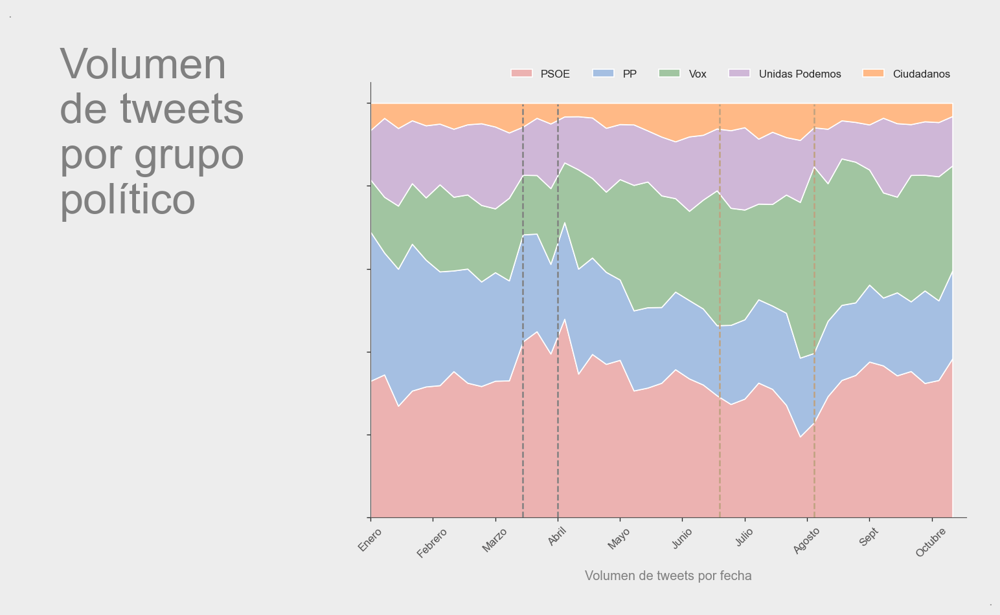

In [84]:
# Recogemos data
df_area_tweets_pivot = pd.pivot_table(df_area_tweets, index=['CREATED_AT_DATE'],
               columns=['LISTA']).reset_index(drop=False)


df_area_tweets_pivot_promedio = df_area_tweets_pivot.divide(df_area_tweets_pivot['ID'][['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos']].sum(axis=1), axis=0)

# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=120)
fig.set_size_inches(15, 6)

# Definimos axis
gs = GridSpec(1, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1:3])

# Título
axtitulo.text(0.1, 0.7,
'Volumen\nde tweets\npor grupo\npolítico', size=40, color='grey')
axtitulo.text(-0.1, 1.15, '.', size=12, color='grey')
axtitulo.text(3.7, -.2, '.', size=12, color='grey', ha='right')
axtitulo.axis('off')


# Plot
plt.stackplot(df_area_tweets_pivot['CREATED_AT_DATE'],
              df_area_tweets_pivot_promedio['ID']['PSOE'],
              df_area_tweets_pivot_promedio['ID']['PP'],
              df_area_tweets_pivot_promedio['ID']['Vox'],
              df_area_tweets_pivot_promedio['ID']['Unidas Podemos'],
              df_area_tweets_pivot_promedio['ID']['Ciudadanos'],
              labels = ['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos'],
              colors= ['#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986'],
              
             )
ax1.legend(ncol=5, bbox_to_anchor=(-0.01, 0.95, 1., .102), loc='upper right')
ax1.set_xlim(1,44)
ax1.set_xlabel('Volumen de tweets por fecha', size=12, color='grey', labelpad=10)
ax1.set_xticks(np.arange(1, 45, step=4.5))
ax1.set_xticklabels(labels=labels_meses, rotation=45, size=10, color='#4f4e4e')
ax1.set_yticklabels('')
ax1.axvline(12, 0, 0.95, color='grey', ls='--', lw=1.5, alpha=1)
ax1.axvline(14.5, 0, 0.95, color='grey', ls='--', lw=1.5, alpha=1)
ax1.axvline(26.2, 0, 0.95, color='#bfa280', ls='--', lw=1.5, alpha=1)
ax1.axvline(33, 0, 0.95, color='#bfa280', ls='--', lw=1.5, alpha=1)

ax1.set_ylabel('')

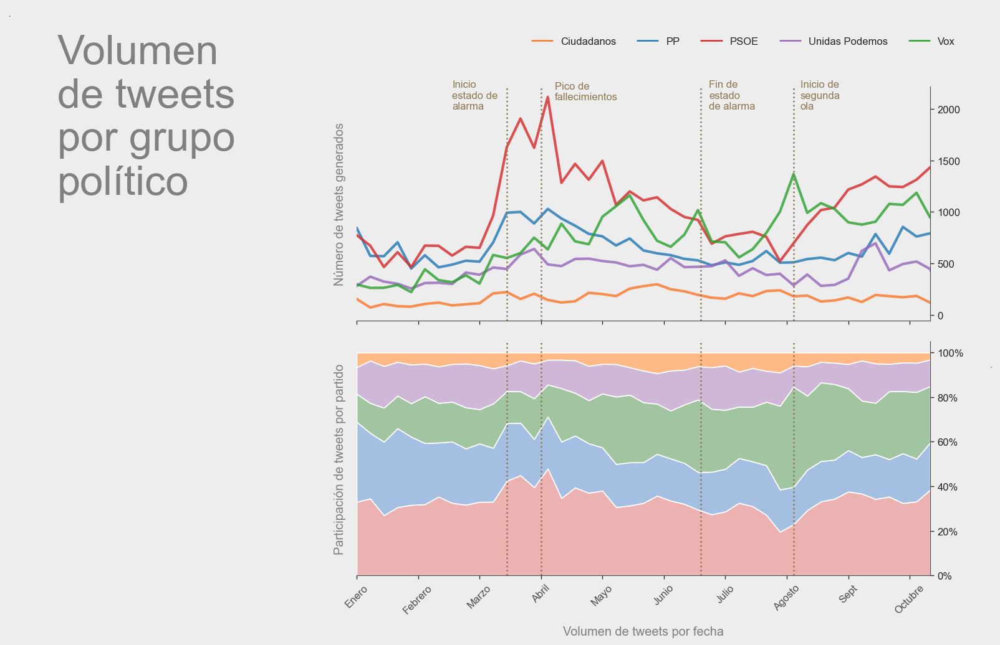

In [85]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=120)
fig.set_size_inches(15, 7)

# Definimos axis
gs = GridSpec(2, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1:3])
ax2 = fig.add_subplot(gs[1, 1:3])

# Título
axtitulo.text(0.1, 0.54,
'Volumen\nde tweets\npor grupo\npolítico', size=40, color='grey')
axtitulo.text(-0.1, 1.3, '.', size=12, color='grey')
axtitulo.text(3.85, -.2, '.', size=12, color='grey', ha='right')
axtitulo.axis('off')

# Plot 1
sns.lineplot(data=df_vol_tweets_lista, x='CREATED_AT_WEEK', y='ID',
             hue='LISTA', ax=ax1, palette=colors_unique, alpha=0.8,
             linewidth = 2.5)

ax1.set_xlabel('')
ax1.set_xticklabels('')
ax1.legend(ncol=5, bbox_to_anchor=(0.06, 1.15, 1., .102), loc='upper right')
ax1.set_xticks(np.arange(1, 45, step=4.5))
ax1.set_ylabel('Número de tweets generados', size=12, color='grey', labelpad=10)




# Plot 2
plt.stackplot(df_area_tweets_pivot['CREATED_AT_DATE'],
              df_area_tweets_pivot_promedio['ID']['PSOE'],
              df_area_tweets_pivot_promedio['ID']['PP'],
              df_area_tweets_pivot_promedio['ID']['Vox'],
              df_area_tweets_pivot_promedio['ID']['Unidas Podemos'],
              df_area_tweets_pivot_promedio['ID']['Ciudadanos'],
              labels = ['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos'],
              colors= ['#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986']              
             )

legend = ax2.legend(ncol=5, bbox_to_anchor=(0.8, 0.8, 1., .102), loc='upper right')
legend.remove()

ax2.set_xlabel('Volumen de tweets por fecha', size=12, color='grey', labelpad=10)
ax2.set_xticks(np.arange(1, 45, step=4.5))
ax2.set_xticklabels(labels=labels_meses, rotation=45, size=10, color='#4f4e4e')
ax2.set_yticklabels(labels=['0%', '20%', '40%', '60%', '80%', '100%'], size=10)
ax2.set_ylabel('Participación de tweets por partido', size=12, color='grey', labelpad=10)

# Anotaciones
list_lines_pos = [12, 14.5, 26.2, 33]
for axes in [ax1, ax2]:
    axes.set_xlim(1,43)
    for posicion in list_lines_pos:
        axes.axvline(posicion, 0, 1, color='#8e764f', ls=':', lw=1.5, alpha=1)


ax1.text(8,2000,'Inicio\nestado de\nalarma', size=10, color='#8e764f', ha='left')
ax1.text(15.5,2090,'Pico de\nfallecimientos', size=10, color='#8e764f', ha='left')
ax1.text(26.8,2000,'Fin de\nestado\nde alarma', size=10, color='#8e764f', ha='left')
ax1.text(33.5,2000,'Inicio de\nsegunda\nola', size=10, color='#8e764f', ha='left')
sns.despine(left=True, bottom=False, right=False)



Podemos observar dos puntos importantes:
- **El inicio de la pandemia**: Hace despegar a los partidos en el volumen de tweets, prácticamente redoblando el número de tweets respecto a los meses previos. Mientras que en PSOE y PP el volumen aumenta y llega al pico cuando se produce el pico de fallecimientos, Vox empieza ahí su crecimiento llegando a su pico a principios de agosto con los rebrotes que se comenzaban a producir en Cataluña.
- **El volumen de tweets no es directamente proporcional al número de diputados**: Pese PSOE duplica en número de diputados a Vox, a principios de agosto este partido publica más que PP y PSOE juntos.

In [ ]:
# SET PARAMETERS

sns.set_style("white")
sns.set_style("ticks", {"xtick.major.size": 1, "ytick.major.size": 1})
plt.rcParams.update({'figure.facecolor':'#ededed',
                     'grid.color': '#ededed',
                     'axes.facecolor': 'rgba(0,0,0,0)',
                     'figure.dpi':72,
                     'axes.linewidth':0.7,
                     'axes.labelcolor': '#565656',
                     'axes.edgecolor': '#4f4e4e',
                     'axes.spines.top': False,
                     'axes.spines.right': False,
                     'legend.frameon': False})

### 2. 2. Tweets totales y tweets por partido

Volumen de tweets por partido en línea temporal. Agrupamos por número de semana para hacer más legible el gráfico:

In [1177]:
df_vol_tweets_lista = tweetsdip.copy()
df_vol_tweets_lista['CREATED_AT_DATE'] = df_vol_tweets_lista['CREATED_AT_DATE'].astype('datetime64')
df_vol_tweets_lista['CREATED_AT_WEEK'] = df_vol_tweets_lista['CREATED_AT_DATE'].dt.week

df_vol_tweets_lista = df_vol_tweets_lista.groupby(['LISTA', 'CREATED_AT_WEEK'],
                                                  as_index=False).count()


In [1178]:
plt.rcParams.update({'figure.facecolor':'#ededed',
                     'grid.color': '#ededed',
                     'axes.facecolor': 'rgba(0,0,0,0)',
                     'figure.dpi':72})

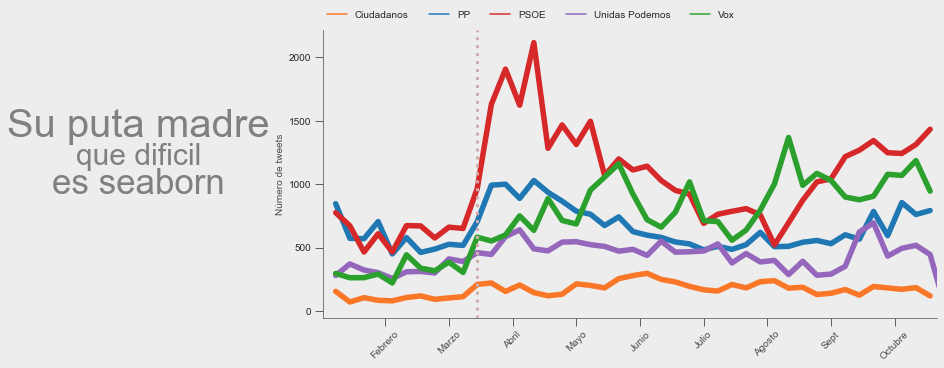

In [1179]:
from matplotlib.gridspec import GridSpec

colors = {'Vox':'#2BA02D', 'PP':'#1F78B4', 'Unidas Podemos': '#9467BC', 'PSOE': '#D62829', 'Ciudadanos': '#fa7728'}
labels_meses = ['Enero', 'Febrero', 'Marzo', 'Abril', 'Mayo', 'Junio', 'Julio', 'Agosto', 'Sept', 'Octubre']


# Creamos figura
fig = plt.figure(constrained_layout=True, figsize=(13, 5))

# Definimos axis
gs = GridSpec(1, 6, figure=fig, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1:])


## TEXTO, axis=0
ax1.text(0.00, 0.63, 'Su puta madre', fontsize=40, color='grey', ha='center')
ax1.text(0.00, 0.53, 'que dificil', fontsize=30, color='grey', ha='center')
ax1.text(0.00, 0.43, 'es seaborn', fontsize=35, color='grey', ha='center')
ax1.axis('off')


## PLOT, axis=1
sns.lineplot(data=df_vol_tweets_lista, x='CREATED_AT_WEEK', y='ID',
             hue='LISTA', ax=ax2, palette=colors, ci=None, alpha=1,
             linewidth = 5.5)


ax2.set_ylabel('Número de tweets', color='#4f4e4e')
ax2.set_xlabel('')
ax2.set_xticks(np.arange(0, 44, step=4.5))
ax2.set_xticklabels(labels=labels_meses, rotation=45, size=10, color='#4f4e4e')
ax2.set_xlim(0.1,43.5)

ax2.axvline(11, 0,1, ls=':', color='#d4aaaa', lw=3)
ax2.spines['left'].set_linewidth(0.7)
ax2.spines['bottom'].set_linewidth(0.7)

ax2.tick_params('both', length=8, width=0.7, which='major')


plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc='lower left',
           ncol=5, mode=None, borderaxespad=0., frameon=False)

sns.despine()

In [1180]:
tweetsdip.describe()

,RETWEET_COUNT,FAVORITE_COUNT,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_TWEET_COUNT,CREATED_AT_HOUR,EDAD
count,"130,407.00","130,407.00","130,407.00","130,407.00","130,407.00",130407,"130,407.00"
mean,165.24,434.30,"79,347.37","3,064.78","19,153.06",0 days 14:05:19.920418,47.93
std,693.65,"2,012.43","276,353.97","6,219.17","22,365.72",0 days 04:45:24.505795,9.74
min,0.00,0.00,17.00,10.00,34.00,0 days 00:00:08,27.00
25%,1.00,3.00,"4,196.00",854.00,"5,080.00",0 days 10:09:00,42.00
50%,8.00,18.00,"9,462.00","1,729.00","11,697.00",0 days 13:50:11,47.00
75%,53.00,117.00,"41,836.00","3,060.00","22,518.00",0 days 18:00:31,54.00
max,"46,494.00","157,820.00","2,613,770.00","99,591.00","139,575.00",0 days 23:59:56,73.00


In [1181]:
tweetsdip.groupby('LISTA').describe().transpose()

LISTA                                   Ciudadanos                      PP  \
RETWEET_COUNT        count                7,280.00               28,195.00   
                     mean                   139.02                  146.63   
                     std                    403.67                  596.17   
                     min                      0.00                    0.00   
                     25%                      2.00                    2.00   
                     50%                     22.00                    7.00   
                     75%                     92.00                   34.00   
                     max                  8,542.00               17,215.00   
FAVORITE_COUNT       count                7,280.00               28,195.00   
                     mean                   376.01                  378.44   
                     std                  1,101.37                1,615.26   
                     min                      0.00                    0.00   
                     25%                      7.00                    3.00   
                     50%                     49.00                   15.00   
                     75%                    219.00                   75.00   
                     max                 21,527.00               58,924.00   
USER_FOLLOWERS_COUNT count                7,280.00               28,195.00   
                     mean                87,674.16               40,420.70   
                     std                195,707.64              107,720.97   
                     min                  1,462.00                   17.00   
                     25%                 10,831.00                2,690.00   
                     50%                 19,370.00                5,090.00   
                     75%                 47,233.00               11,319.00   
                     max                685,159.00              502,564.00   
USER_FOLLOWING_COUNT count                7,280.00               28,195.00   
                     mean                 1,603.30                1,770.67   
                     std                  1,183.67                1,423.66   
                     min                    174.00                   39.00   
                     25%                    518.00                  684.00   
                     50%                  1,067.00                1,504.00   
                     75%                  2,963.00                2,377.00   
                     max                  3,289.00                5,862.00   
USER_TWEET_COUNT     count                7,280.00               28,195.00   
                     mean                18,097.32               15,666.16   
                     std                 11,522.65               19,211.44   
                     min                  1,956.00                   57.00   
                     25%                  6,111.00                5,265.00   
                     50%                 20,071.00               10,033.00   
                     75%                 30,280.00               18,031.00   
                     max                 31,242.00              139,575.00   
CREATED_AT_HOUR      count                    7280                   28195   
                     mean   0 days 14:28:15.737774  0 days 13:46:25.828622   
                     std    0 days 04:27:49.895581  0 days 04:45:12.417355   
                     min           0 days 00:04:35         0 days 00:00:18   
                     25%    0 days 10:50:15.750000  0 days 09:48:25.500000   
                     50%    0 days 14:14:17.500000         0 days 13:19:54   
                     75%    0 days 18:10:31.250000         0 days 17:38:35   
                     max           0 days 23:58:14         0 days 23:59:18   
EDAD                 count                7,280.00               28,195.00   
                     mean                    43.93                   46.47   
                     s

### 2. 3. Frecuencia de tweets por día de la semana

Vamos a comprobar si existen diferencias respecto a la frecuencia de publicación en twitter durante la semana. Par ello, creamos una nueva columna donde indicamos el número relativo al día dentro de la semana, agrupamos por partido político y ploteamos.

In [1183]:
tweetsdip['CREATED_AT_DWEEK'] = tweetsdip['CREATED_AT_DATE'].dt.dayofweek

In [1184]:
##----- Función para obtener gradiente de colores
def get_color(color_ini, color_end, steps, reverse=False):
    color_ini = Color(color_ini)
    color_end = Color(color_end)
    list_colors = list(color_ini.range_to(color_end, steps))
    list_colors = [str(x).split()[0] for x in list_colors]

    if reverse==True:
        list_colors.reverse()
        return list_colors
    
    return list_colors

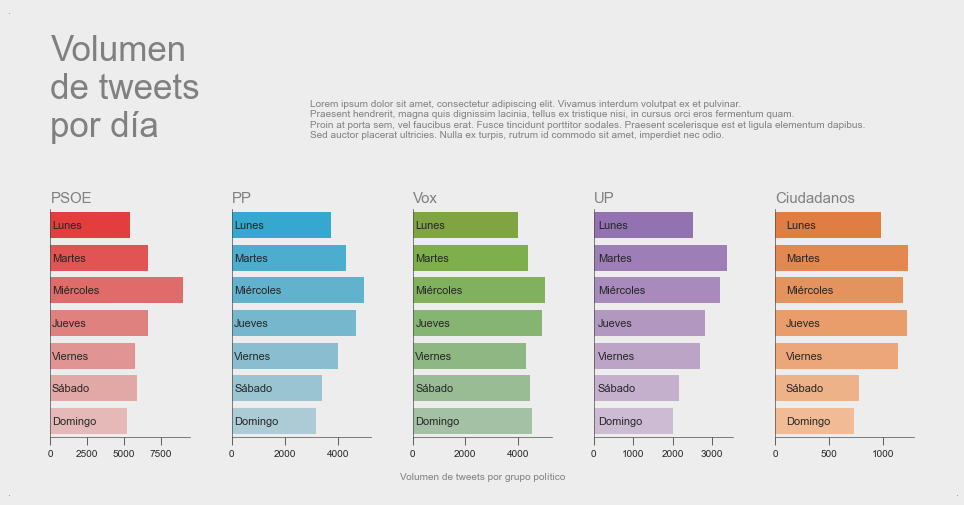

In [1185]:
from matplotlib.colors import LinearSegmentedColormap


# Agrupamos por día de semana y partido
df_tweets_wk = tweetsdip.groupby(['CREATED_AT_DWEEK', 'LISTA'], as_index=False).count()

# Creamos figura
fig = plt.figure(constrained_layout=False)
fig.set_size_inches(15, 6)

plt.tight_layout()

# Definimos axis
gs = GridSpec(7, 5, figure=fig, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)
# Colores
colors = {'Vox': get_color('#83b431', '#a1c5a1', 7),
          'PP': get_color('#1db4e8', '#a6cedc', 7),
          'PSOE': get_color('#ff2121', '#ecb2b0', 7),
          'Unidas Podemos': get_color('#9467bc', '#cfb7d7', 7),
          'Ciudadanos': get_color('#fa7728', '#ffb986', 7)}

###----- Función plot_tweet_dia_semana

def plot_tweet_wday(partido, ax):
    if partido=='Todos':
        data_selected = df_tweets_wk
    else:
        data_selected = df_tweets_wk[df_tweets_wk['LISTA']==partido]
                
    dias_semana = ['Lunes', 'Martes', 'Miércoles', 'Jueves', 'Viernes', 'Sábado', 'Domingo']
    
    plot = sns.barplot(y="CREATED_AT_DWEEK", x='ID', data=data_selected,
                       ax=ax, orient='h', linewidth=0, ci=None,
                       palette=colors[partido])
    
    for index, p in enumerate(plot.patches):
        plot.annotate('{}'.format(dias_semana[index]),
                     (100, p.get_y()+p.get_height()/2+0.1),
                      size=11)

    ax.set_xlabel('')
    ax.set_ylabel('Total de tweets', size=8, color='grey')
    ax.set_yticks(np.arange(0, 7, step=1))
    ax.tick_params('both', length=8, width=0.7, which='major')

    if partido=='Unidas Podemos':
        partido='UP'
    ax.spines['left'].set_linewidth(0.7)
    ax.spines['bottom'].set_linewidth(0.7)
    ax.axes.get_yaxis().set_visible(False)
    ax.set_title(partido, size=15, color='grey', loc='left')
    
    sns.despine()
    
    return plot

#-----------------
ax1 = fig.add_subplot(gs[0:2, :])
ax1.text(-0.05, 1.7, '.', color='grey', ha='left')
ax1.text(0, 0.6, 'Volumen\n\
de tweets\n\
por día', fontsize=35, color='grey', ha='left')
ax1.text(0.3, 0.5,
'Lorem ipsum dolor sit amet, consectetur adipiscing elit. Vivamus interdum volutpat ex et pulvinar.\n\
Praesent hendrerit, magna quis dignissim lacinia, tellus ex tristique nisi, in cursus orci eros fermentum quam.\n\
Proin at porta sem, vel faucibus erat. Fusce tincidunt porttitor sodales. Praesent scelerisque est et ligula elementum dapibus.\n\
Sed auctor placerat ultricies. Nulla ex turpis, rutrum id commodo sit amet, imperdiet nec odio.\n',
         fontsize=10, color='grey')

ax1.axis('off')
ax2 = fig.add_subplot(gs[2:6, 0])
ax3 = fig.add_subplot(gs[2:6, 1])
ax4 = fig.add_subplot(gs[2:6, 2])
ax5 = fig.add_subplot(gs[2:6, 3])
ax6 = fig.add_subplot(gs[2:6, 4])

ax7 = fig.add_subplot(gs[6,:])
ax7.text(0.5,0.3,'Volumen de tweets por grupo político', fontsize=10, color='grey', ha='center')
ax7.text(-0.05,0,'.', fontsize=10, color='grey', ha='left')
ax7.text(1.05,0,'.', fontsize=10, color='grey', ha='right')


ax7.axis('off')




# PLOT 1
plot_tweet_wday('PSOE', ax2)

# PLOT 2
plot_tweet_wday('PP', ax3)

# PLOT 3
plot_tweet_wday('Vox', ax4)

# PLOT 4
plot_tweet_wday('Unidas Podemos', ax5)

# PLOT 5
plot_tweet_wday('Ciudadanos', ax6)

plt.show()

No hay grandes diferencias pero si hay detalles curiosos, mientras que el domingo es el día con menos actividad en todos los grupos políticos, en Vox es el tercer día con más publicaciones de la semana.

### 2. 4. Frecuencia de tweets por hora del día

Analizamos si hay diferencias entre las horas a las que twittean los grupos políticos. Para ello, creamos la columna 'CREATED_AT_HOUR' y agupamos para ver la distribución.

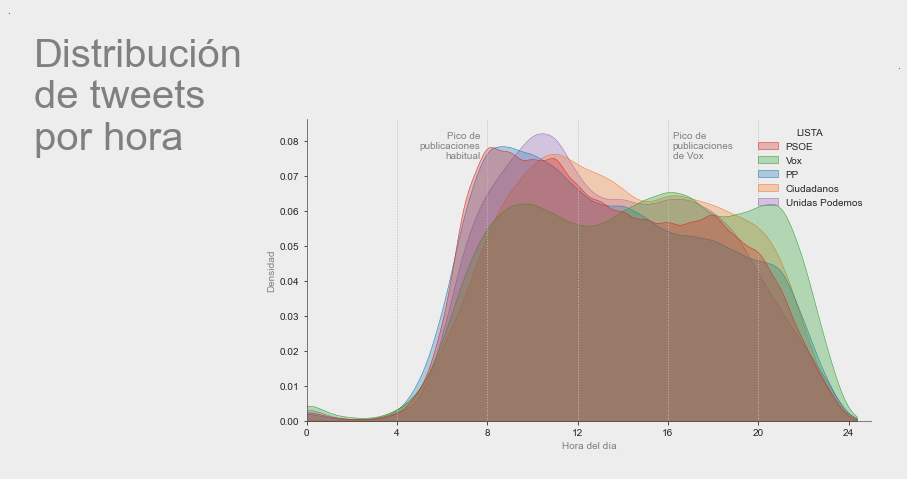

In [1186]:
# Cogemos data
df_tweets_hour = tweetsdip.copy()
df_tweets_hour['CREATED_AT_HOUR'] = df_tweets_hour['CREATED_AT_HOUR'].astype('timedelta64[h]')

# Creamos figura
fig = plt.figure(constrained_layout=False)
fig.set_size_inches(15, 6)
colors_unique = {'Vox':'#2BA02D', 'PP':'#1F78B4', 'Unidas Podemos': '#9467BC', 'PSOE': '#D62829', 'Ciudadanos': '#fa7728'}
colors_unique_pastel = {'Vox':'#a1c5a1', 'PP':'#a5bfe2', 'Unidas Podemos': '#cfb7d7', 'PSOE': '#ecb2b1', 'Ciudadanos': '#ffb986'}

# Definimos axis
gs = GridSpec(8, 6, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

ax1 = fig.add_subplot(gs[1:7, 0:2]) #left
ax2 = fig.add_subplot(gs[1:7, 2:6]) #right plot
#ax3 = fig.add_subplot(gs[1:7, 7])
axtop = fig.add_subplot(gs[0, :])
axbot = fig.add_subplot(gs[7, :])

# BOX_IZQ
ax1.text(0, 1.35, '.', size=10)
ax1.text(0.1,0.9,
'Distribución\n\
de tweets\n\
por hora', size=40, color='grey')
ax1.axis('off')

# BOX_DER
#ax3.text(1,0.7,'.', size=40, color='grey')
#ax3.axis('off')

# TOP
axtop.text(1.03, 1, '.', size=10)
axtop.axis('off')

# BOTTOM
axbot.axis('off')

# Plot

plot_tweets_hora = sns.kdeplot(data=df_tweets_hour, x='CREATED_AT_HOUR', hue='LISTA',
                               palette=colors_unique, lw=0.5, alpha=0.3, ax=ax2,
                               cumulative=False, common_norm=False, common_grid=True, fill=True)

#plt.title('A')



handles, labels = ax.get_legend_handles_labels()
#order = [2,1,4,3,0]
#ax2.legend(labels=[labels[idx] for idx in order], handles=[handles[idx] for idx in order],
#           loc='upper left', mode=None, ncol=5, bbox_to_anchor=(0., 1.02, 1., .102), frameon=False)

ax2.set_xticks(np.arange(0, 25, step=4))
ax2.set_xlim(0,25)
ax2.set_xlabel('Hora del día', size=10, color='grey')
ax2.set_ylabel('Densidad', size=10, color='grey')
for hora in np.arange(0, 21, 4):
    ax2.axvline(hora, 0,1, ls=':', color='#bcbcbc', lw=1)

ax2.text(16.2, 0.075,
'Pico de\npublicaciones\nde Vox', size=10, color='grey')

ax2.text(7.7, 0.075,
'Pico de\npublicaciones\nhabitual', size=10, color='grey', ha='right')



plt.show();

Las únicas diferencias las encontramos en Vox, mientras que todos los grupos tienen su pico de publicación entre las 8 y 12 de la mañana, Vox alcanza su pico a las 16h teniendo prácticamente un ritmo de actualización constante de 8 de la mañana a 22 horas.

##### - ¿Hay diferencia en Vox respecto al fin de semana?

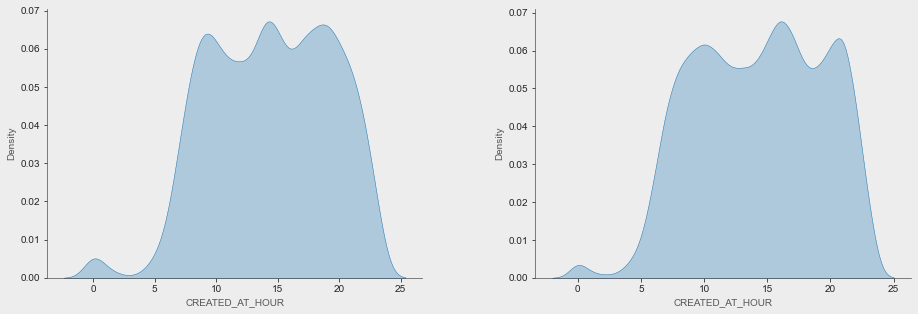

In [1187]:
df_tweets_hour

# Creamos figura
fig = plt.figure(constrained_layout=False)
fig.set_size_inches(15, 4)
colors_unique = {'Vox':'#2BA02D', 'PP':'#1F78B4', 'Unidas Podemos': '#9467BC', 'PSOE': '#D62829', 'Ciudadanos': '#fa7728'}

# Definimos axis
gs = GridSpec(1, 2, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

ax1 = fig.add_subplot(gs[0,0])
ax2 = fig.add_subplot(gs[0,1])

sns.kdeplot(data=df_tweets_hour[(df_tweets_hour['LISTA']=='Vox') & \
                                (df_tweets_hour['CREATED_AT_DWEEK'].isin([5,6]))], x='CREATED_AT_HOUR',
            palette=colors_unique, lw=0.5, alpha=0.3,
            cumulative=False, common_norm=False, common_grid=True, fill=True, ax=ax1)

sns.kdeplot(data=df_tweets_hour[(df_tweets_hour['LISTA']=='Vox') & \
                                (df_tweets_hour['CREATED_AT_DWEEK'].isin([0,1,2,3,4]))], x='CREATED_AT_HOUR',
            palette=colors_unique, lw=0.5, alpha=0.3,
            cumulative=False, common_norm=False, common_grid=True, fill=True, ax=ax2)

No encontramos diferencias en el patrón de uso de twitter entre semana y fines de semana.

### 2. 5. Uso de twitter por edad

Edad media de cada diptuado con twitter por grupo político:

            LISTA  EDAD
0      Ciudadanos 43.93
1              PP 46.47
2            PSOE 47.44
3  Unidas Podemos 46.00
4             Vox 51.97


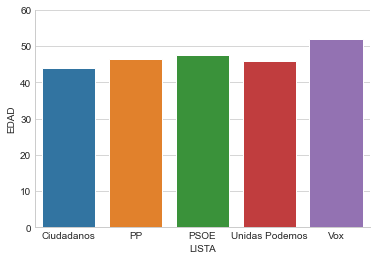

In [1188]:
df_edad = tweetsdip[['EDAD', 'LISTA']].groupby('LISTA', as_index=False).mean()
print(df_edad)
with plt.style.context('seaborn-whitegrid'):
    sns.barplot(data=df_edad, x='LISTA', y='EDAD')
    plt.ylim(0,60)

Ciudadanos es el grupo con la edad media más baja, seguido por Unidas Podemos, PP y PSOE. Vox es el único partido que supera la barrera de los 50 años de media.

In [1189]:
df_tweets_por_edad = tweetsdip[['ID', 'USER_SCREEN_NAME', 'LISTA', 'EDAD']].groupby(['LISTA', 'USER_SCREEN_NAME', 'EDAD'], as_index=False).count()
df_tweets_por_edad.head(1)

,LISTA,USER_SCREEN_NAME,EDAD,ID
0,Ciudadanos,BalEdmundo,53,515


**¿Cómo está distribuida la edad dentro de los grupos?**
Si atendemos al valor más frecuente, Unidas Podemos asciende al primer puesto con una mediana de edad más baja que cualquier otro grupo.

In [1190]:
df_tweets_por_edad['EDADxID'] = df_tweets_por_edad['EDAD'] * df_tweets_por_edad['ID']
print('Mediana Cs', df_tweets_por_edad[df_tweets_por_edad['LISTA']=='Ciudadanos'].median()[0])
print('Mediana UP', df_tweets_por_edad[df_tweets_por_edad['LISTA']=='Unidas Podemos'].median()[0])
print('Mediana PSOE', df_tweets_por_edad[df_tweets_por_edad['LISTA']=='PSOE'].median()[0])
print('Mediana PP', df_tweets_por_edad[df_tweets_por_edad['LISTA']=='PP'].median()[0])
print('Mediana Vox', df_tweets_por_edad[df_tweets_por_edad['LISTA']=='Vox'].median()[0])

Mediana Cs 42.5
Mediana UP 42.0
Mediana PSOE 47.0
Mediana PP 48.0
Mediana Vox 50.0


[]


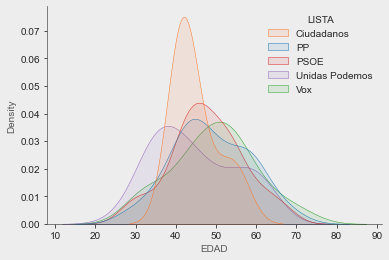

In [1191]:
plot_kde = sns.kdeplot(data=df_tweets_por_edad, x='EDAD', hue='LISTA', common_norm=False, palette=colors_unique,
            fill=True, alpha=0.1, lw=0.5)
print(plot_kde.lines)

Aquí podemos ver la distribución de la variable 'EDAD' dentro de los grupos. En Ciudadanos está muy concentrada entorno a los 42.2 años y  Unidas Podemos concentra su edad en los 40.

In [1192]:
tweetsdip[tweetsdip['LISTA']=='Vox'].groupby('USER_SCREEN_NAME', as_index=False).mean().sort_values('EDAD').head(1)

,USER_SCREEN_NAME,RETWEET_COUNT,FAVORITE_COUNT,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_TWEET_COUNT,EDAD,IS_TOP_TWEET,CREATED_AT_DWEEK
14,MariscalZabala,226.30,562.48,"28,176.59","1,751.00","22,181.00",28.00,0.27,2.07


**¿Existe relación entre la edad del diputado y su actividad en Twitter?**

Vamos a elaborar un scatterplot para comprobarlo de forma visual:

Text(1.1, -0.2, '.')

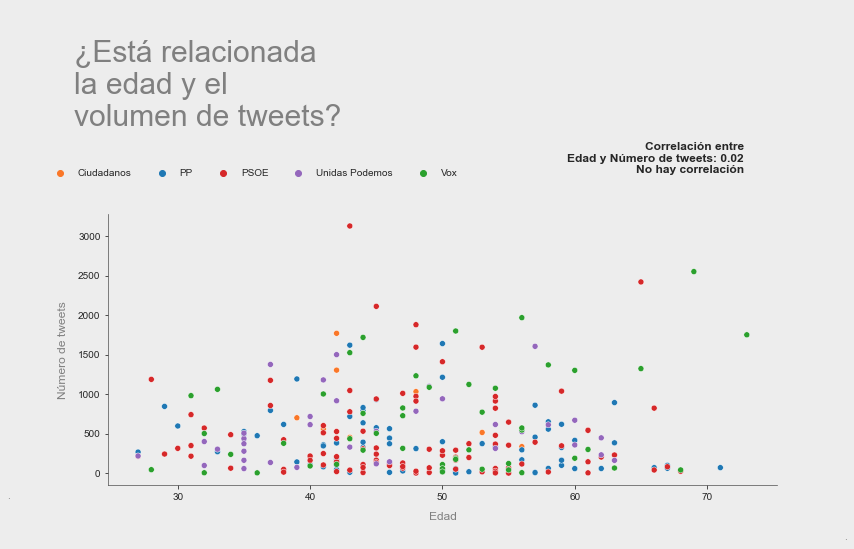

In [1193]:
f, ax = plt.subplots(1, figsize=(12,5))
#plt.figure(figsize=(12,5))
plot = sns.scatterplot(data=df_tweets_por_edad, x='EDAD', y='ID', hue='LISTA', palette=colors_unique, ax=ax)
ax.legend(loc='upper left', ncol=5, bbox_to_anchor=(-0.1, 1.2))
ax.set_ylabel('Número de tweets', size=12, color='grey', labelpad=10)
ax.set_xlabel('Edad', size=12, color='grey', labelpad=10);
ax.text(0.95,1.15, """
Correlación entre\n\
Edad y Número de tweets: {:.2f}
No hay correlación""".format(df_tweets_por_edad[['EDAD', 'ID']].corr().iloc[0,1]),
        transform=ax.transAxes, ha='right', size=12, weight='bold')
pad_right = ax.set_title("""
¿Está relacionada\n\
la edad y el\n\
volumen de tweets?""", y=1.3, x=-0.05, size=30, ha='left', color='grey')
ax.text(-0.15,-0.05, '.', size=10, color='grey', transform=ax.transAxes)
pad_left = ax.set_title("""
¿Está relacionada\n\
la edad y el\n\
volumen de tweets?""", y=1.3, x=-0.05, size=30, ha='left', color='grey')
ax.text(1.1,-0.2, '.', size=10, color='grey', transform=ax.transAxes)

Vemos que las variables no están correlacionadas. Lo comprobamos también con una matriz de correlación:

In [1194]:
df_tweets_por_edad[['EDAD', 'ID']].corr()

,EDAD,ID
EDAD,1.00,0.02
ID,0.02,1.00


#### 2. 5. 1. Volumen de tweets por edad y grupo

Las siguientes gráficas marcan la distribución entre el volumen de tweets y la edad de cada grupo. Podemos observar los datos en un swarmplot y un boxplot:

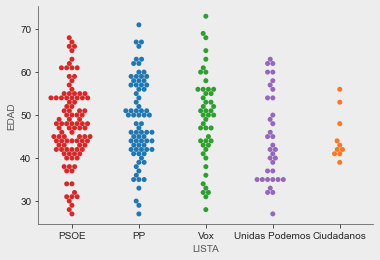

In [1195]:
#ax = sns.violinplot(data=df_tweets_por_edad, x='LISTA', y='EDAD', palette=colors_unique,
#               alpha=0.2, lw=0, cut=0, inner=None)
#plt.setp(ax.collections, edgecolor='#EDEDED')
sns.swarmplot(data=df_tweets_por_edad, x='LISTA', y='EDAD',
              palette=colors_unique, alpha=1, order=['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos'])


En el swarmplot comprobamos que:
- PSOE: La variable sigue una distribución normal, con una concentración en la media.
- PP: La variable está más dispersa, teniendo un mínimo y máximo más amplio que en el grupo socialista.
- Vox: Está bastante repartida la variable y poco concentrada, teniendo tanto a diputados jóvenes como a mayores de 70 años twitteando.
- Unidas Podemos: La variable se concentra entorno a los 37 años de edad, aunque se distribuye a lo largo de un rango entre 28 y 63 años.
- Ciudadanos: Pocos diputados que analizar, pero con un uso de twitter que se concentra entorno a aquellos de 45 años.

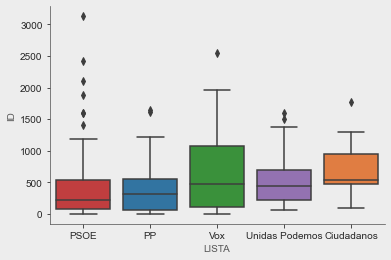

In [1225]:
sns.boxplot(data=df_tweets_por_edad, x='LISTA', y='ID', palette=colors_unique, order=['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos'])

##### Vista general sobre edad y uso de twitter

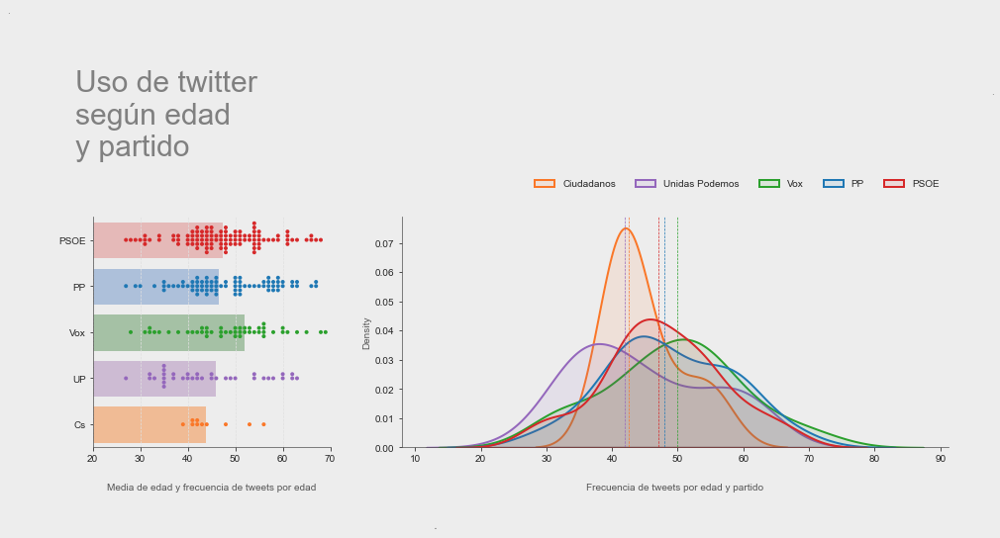

In [1197]:
# Creamos figura
fig = plt.figure(constrained_layout=False)
fig.set_size_inches(15, 7)

# Definimos axis
gs = GridSpec(8, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtop = fig.add_subplot(gs[0,:])
axtitulo = fig.add_subplot(gs[1:3,:])
ax1 = fig.add_subplot(gs[3:7, 0])
ax2 = fig.add_subplot(gs[3:7, 1:3])
#ax3 = fig.add_subplot(gs[3:7, 2])
axbottom = fig.add_subplot(gs[7,:])

axtop.text(-0.1, 1.5,'.',size=10, color='grey')
axtop.text(1.05, 0,'.',size=10, color='grey')
axtop.axis('off')
axbottom.axis('off')
axtitulo.axis('off')
axbottom.text(0.4,-0.4,'.', ha='center', color='grey', size=14)
axbottom.text(0.4,0,' ', ha='center', color='grey', size=14)

order = ['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos']
labels = ['PSOE', 'PP', 'Vox', 'UP', 'Cs']
# Título
axtitulo.text(-0.02, 0.5,
'Uso de twitter\nsegún edad\ny partido',size=30, color='grey')

# Plot 1
df_edad = tweetsdip[['EDAD', 'LISTA']].groupby('LISTA', as_index=False).mean()
sns.barplot(data=df_edad, y='LISTA', x='EDAD', ax=ax1, palette=colors_unique_pastel,
            orient='h', edgecolor='#EDEDED', order=order)
ax1.set_xlim(20,70)


# Plot 2
plot_swarm = sns.swarmplot(data=df_tweets_por_edad, y='LISTA', x='EDAD',
              palette=colors_unique, alpha=1, size=4,
              order=order, ax=ax1)
for i in np.arange(0,70,step=10):
    ax1.axvline(i, 0, 1, color='#e0e0e0', ls='--', lw=0.7)


# Plot 3
sns.kdeplot(data=df_tweets_por_edad, x='EDAD', hue='LISTA', common_norm=False, palette=colors_unique,
            fill=True, alpha=0.1, lw=2, ax=ax2, hue_order=order)
ax2.legend(loc='upper right', ncol=5, labels=['Ciudadanos', 'Unidas Podemos', 'Vox', 'PP', 'PSOE'], bbox_to_anchor=(1, 1.2))
ax2.axvline(42, 0, 1, color=colors_unique['Unidas Podemos'], ls='--', lw=0.7)
ax2.axvline(42.5, 0, 1, color=colors_unique['Ciudadanos'], ls='--', lw=0.7)
ax2.axvline(47, 0, 1, color=colors_unique['PSOE'], ls='--', lw=0.7)
ax2.axvline(48, 0, 1, color=colors_unique['PP'], ls='--', lw=0.7)
ax2.axvline(50, 0, 1, color=colors_unique['Vox'], ls='--', lw=0.7)
ax2.set_xlabel('Frecuencia de tweets por edad y partido', labelpad=20)
ax1.set_ylabel('')
ax1.set_xlabel('Media de edad y frecuencia de tweets por edad', labelpad=20)
ax1.set_yticklabels(labels=labels);


### 2. 6. Uso de twitter según sexo y partido

Calculamos de cuántos días tenemos el registro de tweets:

In [1198]:
tweetsdip[['CREATED_AT_DATE']].max() - tweetsdip[['CREATED_AT_DATE']].min()

CREATED_AT_DATE   306 days
dtype: timedelta64[ns]

Dividimos los tweets totales de cada diputados entre 297 días y obtenemos la media diaria:

In [1199]:
df_tweets_sexo = tweetsdip[['ID', 'USER_SCREEN_NAME', 'SEXO', 'LISTA']].groupby(['LISTA', 'USER_SCREEN_NAME', 'SEXO'], as_index=False).count()
df_tweets_sexo['ID'] = df_tweets_sexo['ID']/297

df_tweets_sexo.head()

,LISTA,USER_SCREEN_NAME,SEXO,ID
0,Ciudadanos,BalEdmundo,Hombre,1.73
1,Ciudadanos,GuillermoDiazCs,Hombre,4.39
2,Ciudadanos,InesArrimadas,Mujer,2.36
3,Ciudadanos,MCMartinez_Cs,Mujer,1.73
4,Ciudadanos,MGutierrezCs,Hombre,1.13


Text(0, -0.3, '.')

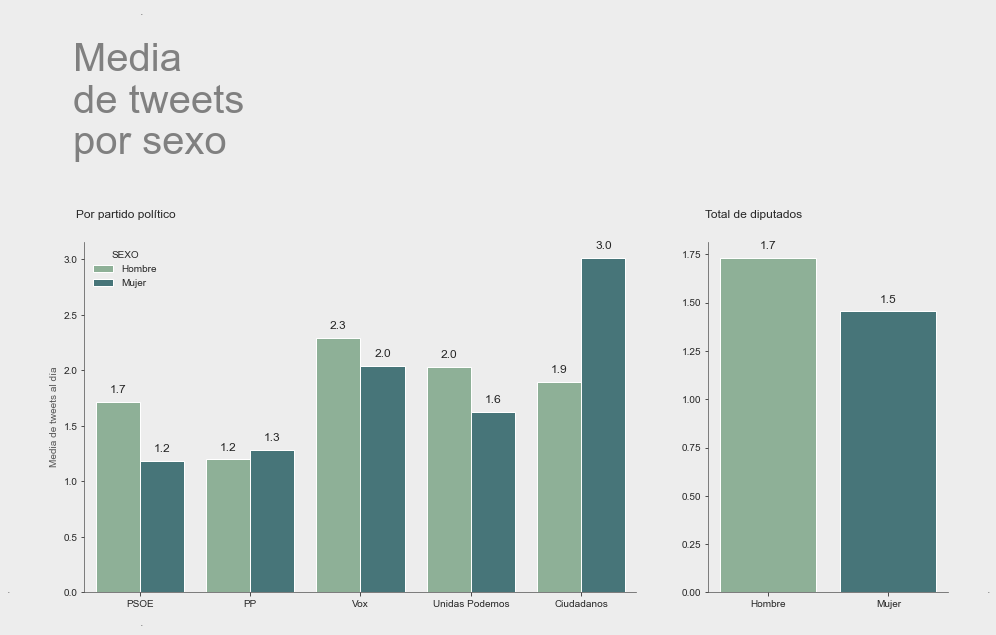

In [1200]:
# Creamos figura
fig = plt.figure(constrained_layout=False)
fig.set_size_inches(15, 7)

# Definimos axis
gs = GridSpec(4, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0,:])
ax1 = fig.add_subplot(gs[1:, 0:2])
ax2 = fig.add_subplot(gs[1:, 2])

# Título
axtitulo.text(-0.013,0.7,
"""Media\nde tweets\npor sexo""", size=40, color='grey')
axtitulo.axis('off')

# Plot 1
plot_tweets_sexo = sns.barplot(data=df_tweets_sexo, x='LISTA', y='ID', hue='SEXO',
                               order=order, ax=ax1, palette=['#89B594', '#3F7C81'], ci=None)

ax.set_xlabel('Partido político', size=12)
ax.set_ylabel('Media de tweets al día', size=12)

for barra in plot_tweets_sexo.patches:
    plot_tweets_sexo.annotate(format(barra.get_height(), '.1f'), 
                   (barra.get_x() + barra.get_width() / 2., barra.get_height()), 
                   ha = 'center', va = 'center', 
                   size=12,
                   xytext = (0, 12), 
                   textcoords = 'offset points')
    
# Plot 2
plot_total_sexo = sns.barplot(data=df_tweets_sexo, x='SEXO', y='ID', ci=None, ax=ax2, palette=['#89B594', '#3F7C81'])
for barra in plot_total_sexo.patches:
    plot_total_sexo.annotate(format(barra.get_height(), '.1f'), 
                   (barra.get_x() + barra.get_width() / 2., barra.get_height()), 
                   ha = 'center', va = 'center', 
                   size=12,
                   xytext = (0, 12), 
                   textcoords = 'offset points')

# Etiquetas
ax1.set_xlabel('')
ax1.set_ylabel('Media de tweets al día')
ax1.set_title('Por partido político', ha='left', x=-0.015, y=1.05)

ax2.set_xlabel('')
ax2.set_ylabel('')
ax2.set_title('Total de diputados', ha='left', x=-0.015, y=1.05)

# Paddings
ax1.text(-1.2, 0, '.', size=12, color='grey')
ax1.text(7.7, 0, '.', size=12, color='grey', ha='right')
ax1.text(0, 5.2, '.', size=12, color='grey')
ax1.text(0, -0.3, '.', size=12, color='grey')

Podemos extraer la conclusión de que, de media, los hombres twittean más que las mujeres. Nos encontramos con dos excepciones: Ciudadanos donde la media es muy superior al resto de medias, y el Partido Popular, donde existe poca diferencia siendo mayor la media dentro de sus diputadas.

### 2. 7. Tweets vs número de seguidores

##### Distribución del volumen de tweets generado

¿Está relacionada la frecuencia de tweets con el número de seguidores?

In [1202]:
df_tweets_seguidores = tweetsdip[['USER_SCREEN_NAME', 'ID', 'USER_FOLLOWERS_COUNT',
                                  'USER_FOLLOWING_COUNT', 'USER_TWEET_COUNT', 'LISTA']]
df_tweets_seguidores.groupby(['USER_SCREEN_NAME', 'ID'], as_index=False).count()['USER_SCREEN_NAME']

0         A_LopezMaraver
1         A_LopezMaraver
2         A_LopezMaraver
3         A_LopezMaraver
4             Adrilastra
               ...      
130304      vicpiriz1975
130305      vicpiriz1975
130306      vicpiriz1975
130307      vicpiriz1975
130308      vicpiriz1975
Name: USER_SCREEN_NAME, Length: 130309, dtype: object

In [1203]:
df_tweets_seguidores = tweetsdip[['USER_SCREEN_NAME', 'ID', 'USER_FOLLOWERS_COUNT',
                                  'USER_FOLLOWING_COUNT', 'USER_TWEET_COUNT', 'LISTA']]
# Agregamos columna con un 1 en cada tweet
df_tweets_seguidores.loc[:, 'TWEETS'] = 1
df_tweets_seguidores = df_tweets_seguidores.groupby(['USER_SCREEN_NAME',
                                                     'ID',
                                                     'LISTA'], as_index=False).max()
# Eliminamos columna ID
df_tweets_seguidores.drop('ID', axis=1, inplace=True)
df_tweets_seguidores.head()

# Creamos pivot table para contar el número de tweets por usuario
df_tweets_seguidores = pd.pivot_table(df_tweets_seguidores, values='TWEETS',
                                      index=['USER_SCREEN_NAME', 'LISTA', 'USER_FOLLOWERS_COUNT', 'USER_FOLLOWING_COUNT', 'USER_TWEET_COUNT'],
                                      aggfunc=np.sum).reset_index(drop=False)
df_tweets_seguidores.head()

,USER_SCREEN_NAME,LISTA,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_TWEET_COUNT,TWEETS
0,A_LopezMaraver,Vox,1995,111,389,4
1,Adrilastra,PSOE,105904,9273,23217,105
2,Adrilastra,PSOE,105905,9273,23217,143
3,Aglezterol,PP,21883,854,30873,637
4,AgustinRosety,Vox,54338,1183,7186,227


Distribución del número de tweets publicados por cada diputado:

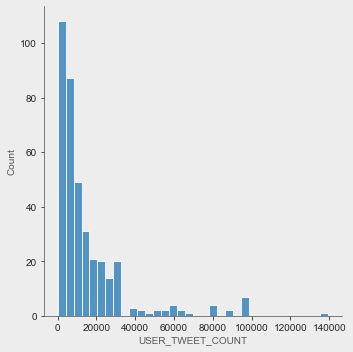

In [1204]:
sns.displot(data=df_tweets_seguidores, x='USER_TWEET_COUNT')

Ploteamos en scatterplot

##### El perfil del diputado twittero: Seguidores, seguidos y volumen de publicación

(0.0, 1.0, 0.0, 1.0)

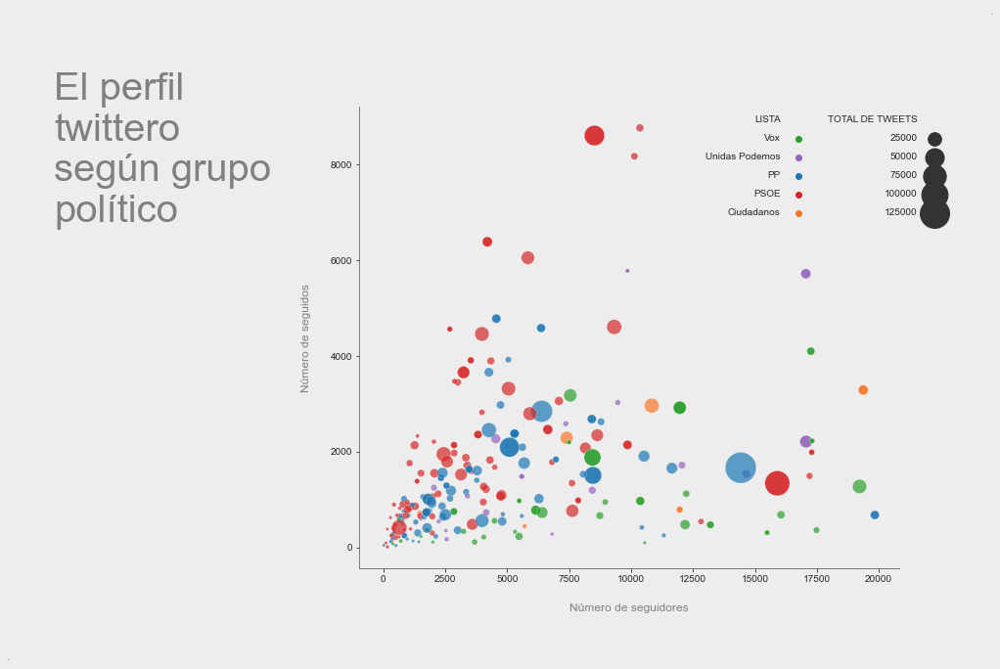

In [1206]:
# Creamos figura
fig = plt.figure(constrained_layout=False)
fig.set_size_inches(15, 7)

# Definimos axis
gs = GridSpec(1, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0,0])
ax1 = fig.add_subplot(gs[0, 1:3])

sns.scatterplot(data=df_tweets_seguidores[df_tweets_seguidores['USER_FOLLOWERS_COUNT']<20000],
                                          x='USER_FOLLOWERS_COUNT', y='USER_FOLLOWING_COUNT', hue='LISTA', size='USER_TWEET_COUNT', sizes=(10,1000),
               palette=colors_unique, alpha=0.7, ax=ax1, legend='brief')


handles, labels = ax1.get_legend_handles_labels()
labels[6] = 'TOTAL DE TWEETS'
leg = ax1.legend(handles=handles, labels=labels, bbox_to_anchor=(1.1,1), loc='upper right', ncol=2, labelspacing=1.0, markerfirst=False)
leg._legend_box.align = "right"

ax1.set_xlabel('Número de seguidores', size=12, color='grey', labelpad=20)
ax1.set_ylabel('Número de seguidos', size=12, color='grey', labelpad=20)

# Título
axtitulo.text(0,0.75,
'El perfil\ntwittero\nsegún grupo\npolítico', size=40, color='grey')
axtitulo.text(-0.2, -0.2, '.', size=12, color='grey', ha='left')
axtitulo.text(4, 1.2, '.', size=12, color='grey', ha='right')

axtitulo.axis('off')



Vemos una correlación ligera entre **número de seguidores y número de seguidos**, siendo los grupos de izquierdas los que muestran una curva más inclinada que los grupos de derecha. ¿Són estos más proclives a aumentar el número de personas seguidas que los grupos de derechas?

##### Matriz de correlación entre seguidores y seguidos. ¿Qué variables están relacionadas?

Matriz de correlación entre seguidores y seguidos:

In [1207]:
corr = df_tweets_seguidores[(df_tweets_seguidores['USER_FOLLOWERS_COUNT']<10000) &\
                     (df_tweets_seguidores['LISTA']=='Vox')].corr()
corr

,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_TWEET_COUNT,TWEETS
USER_FOLLOWERS_COUNT,1.00,0.67,0.57,0.21
USER_FOLLOWING_COUNT,0.67,1.00,0.57,0.01
USER_TWEET_COUNT,0.57,0.57,1.00,0.02
TWEETS,0.21,0.01,0.02,1.00


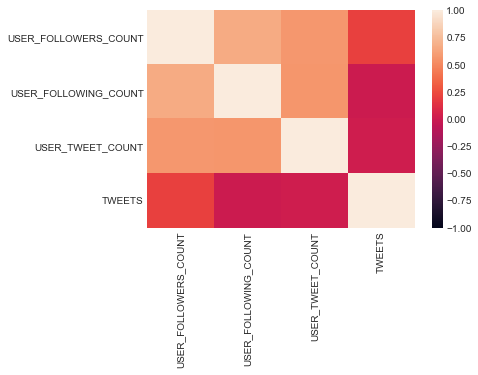

In [1208]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(dpi=72)
    sns.heatmap(corr, vmin=-1, vmax=1)

Matriz de correlación entre variables numéricas

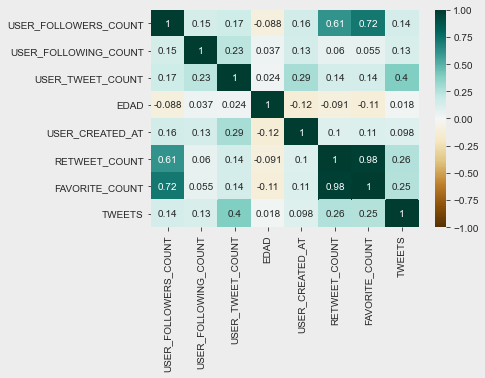

In [1209]:
# Creamos un subdataframe
df_prueba = tweetsdip[['ID', 'USER_SCREEN_NAME', 'USER_FOLLOWERS_COUNT', 'USER_FOLLOWING_COUNT',
                       'USER_TWEET_COUNT', 'EDAD', 'RETWEET_COUNT', 'FAVORITE_COUNT',
                       'CREATED_AT_DATE', 'USER_CREATED_AT', 'LISTA']]
# Añadimos contador de tweets
df_prueba.loc[:, 'TWEETS'] = 1

# Separamos dataframes para operar
df_prueba_1 = df_prueba[['USER_SCREEN_NAME',
                        'USER_FOLLOWERS_COUNT',
                        'USER_FOLLOWING_COUNT',
                        'USER_TWEET_COUNT',
                        'EDAD',
                        'USER_CREATED_AT',
                        'LISTA']].groupby('USER_SCREEN_NAME', as_index=False).min()

df_prueba_2 = df_prueba[['USER_SCREEN_NAME',
                         'RETWEET_COUNT',
                         'FAVORITE_COUNT',
                         'TWEETS']].groupby('USER_SCREEN_NAME', as_index=False).sum()

df_prueba_merge = df_prueba_1.merge(df_prueba_2,
                                    on='USER_SCREEN_NAME')

# Añadimos columna con los días que lleva cada cuenta activa
fecha_actual = pd.to_datetime('20201020', format='%Y%m%d', errors='ignore')
df_prueba_merge['USER_CREATED_AT'] = fecha_actual - df_prueba_merge['USER_CREATED_AT']
df_prueba_merge['USER_CREATED_AT'] = df_prueba_merge['USER_CREATED_AT'].apply(lambda x: x.days)

# Ploteamos heatmap
plt.figure(dpi=72)
sns.heatmap(df_prueba_merge.corr(), vmin=-1, vmax=1, cmap='BrBG', annot=True)


Matriz de correlación entre variables numéricas por grupo político:

Text(-0.35, -2.1, '.')

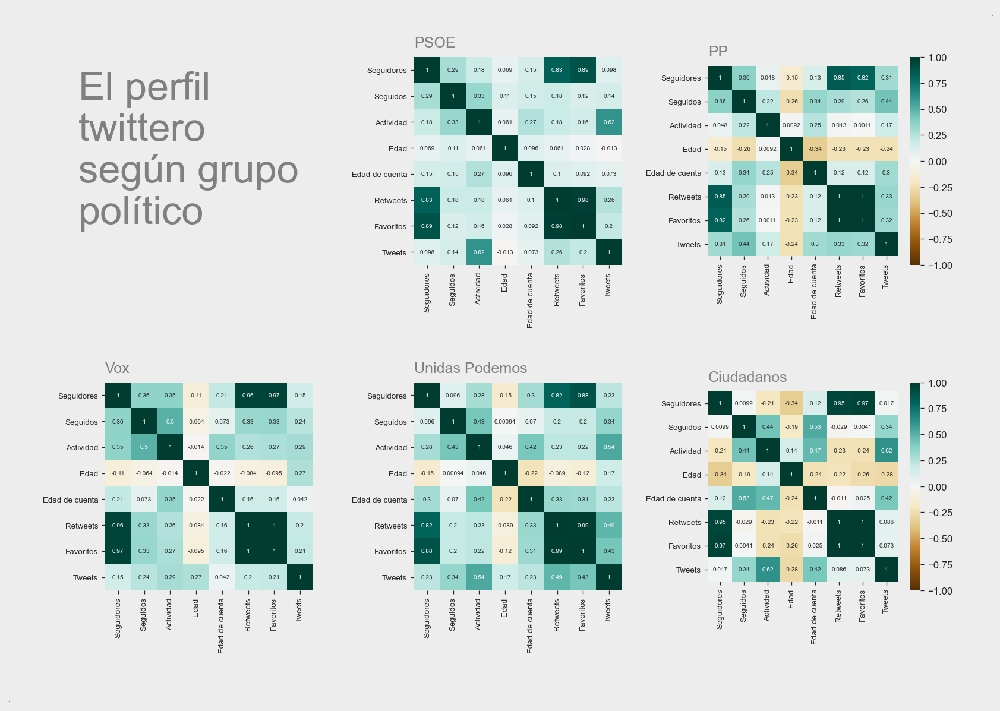

In [1210]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=120)
fig.set_size_inches(15, 8)

# Definimos axis
gs = GridSpec(5, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0:2, 0])
axtitulo_inf = fig.add_subplot(gs[2,:])

ax1 = fig.add_subplot(gs[0:2, 1])
ax2 = fig.add_subplot(gs[0:2, 2])
ax3 = fig.add_subplot(gs[3:5, 0])
ax4 = fig.add_subplot(gs[3:5, 1])
ax5 = fig.add_subplot(gs[3:5, 2])

# Títulos
axtitulo.text(-0.05,0.2,
'El perfil\ntwittero\nsegún grupo\npolítico', size=40, color='grey')
axtitulo.axis('off')
axtitulo_inf.axis('off')

# Ploting
axis = [ax1, ax2, ax3, ax4, ax5]
partidos = ['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos']
labels = ['Seguidores', 'Seguidos', 'Actividad', 'Edad', 'Edad de cuenta', 'Retweets', 'Favoritos', 'Tweets']

for i in range(5):
    if axis[i] == ax2 or axis[i] == ax5:
        cbar=True
    else:
        cbar=False
    sns.heatmap(df_prueba_merge[df_prueba_merge['LISTA']==partidos[i]].corr(),
                vmin=-1, vmax=1, cmap='BrBG', ax=axis[i], annot=True, annot_kws={"size":6}, cbar=cbar, square=True)
    axis[i].set_xticklabels(labels = labels, size=8)
    axis[i].set_yticklabels(labels = labels, size=8)
    axis[i].set_title(partidos[i], loc='left', size=15, pad=10, color='grey')

    
# Margins
axtitulo.text(3.8, 1.2, '.', size=12, color='grey', ha='right')
axtitulo.text(-0.35, -2.1, '.', size=12, color='grey', ha='left')


Comprobamos las variables relacionadas entre si para cada grupo. Solamente en **PSOE** la variable 'EDAD' se correlaciona de forma claramente posivita con el resto de variables. Por parejas: **PP y Ciudadanos** muestran un patrón más similar que el resto, y **Unidas Podemos** y **Vox** muestran una correlación de variables parecida.

### 2. 8. Análisis del uso de Twitter por partido:

In [1211]:
df_prueba_merge.head(3)

,USER_SCREEN_NAME,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_TWEET_COUNT,EDAD,USER_CREATED_AT,LISTA,RETWEET_COUNT,FAVORITE_COUNT,TWEETS
0,A_LopezMaraver,1995,111,389,36,770,Vox,1362,3432,4
1,Adrilastra,105904,9273,23217,41,3665,PSOE,237172,720864,248
2,Aglezterol,21883,854,30873,44,3757,PP,70202,128727,637


##### Número de seguidores y partido político

In [1212]:
percentiles = [100, 90, 80, 60, 40, 20]
dicc = {'Percentiles': ['P100', 'P90', 'P80', 'P60', 'P40', 'P20']}

for partido in df_prueba_merge['LISTA'].unique():
    var = df_prueba_merge[df_prueba_merge['LISTA']==partido]['USER_FOLLOWERS_COUNT']
    lista_percentiles = []
    for percentil in percentiles:
        lista_percentiles.append(np.percentile(var, percentil))
    dicc[partido] = lista_percentiles

df_percentiles = pd.DataFrame(dicc).set_index('Percentiles').astype(int)
df_percentiles

,Vox,PSOE,PP,Unidas Podemos,Ciudadanos
Percentiles,,,,,
P100,524893,1478013,502562,2613703,685134
P90,78468,33943,22724,418056,111023
P80,35834,10020,8722,80622,41875
P60,15602,4150,4767,30990,21670
P40,8260,2179,2391,9696,11509
P20,3829,899,1218,4458,7059


In [1213]:
df_followers_por_grupo = df_prueba_merge.groupby('LISTA').describe()['USER_FOLLOWERS_COUNT'].apply(lambda x: round(x))
df_followers_por_grupo

,count,mean,std,min,25%,50%,75%,max
LISTA,,,,,,,,
Ciudadanos,10.00,"85,475.00","211,234.00","1,462.00","8,256.00","15,666.00","36,682.00","685,134.00"
PP,77.00,"19,623.00","69,083.00",17.00,"1,598.00","3,458.00","6,961.00","502,562.00"
PSOE,103.00,"29,403.00","151,786.00",104.00,"1,078.00","3,328.00","8,008.00","1,478,013.00"
Unidas Podemos,35.00,"166,833.00","481,424.00","1,514.00","5,304.00","17,051.00","64,859.00","2,613,703.00"
Vox,48.00,"41,083.00","90,854.00",383.00,"5,104.00","11,256.00","30,831.00","524,893.00"


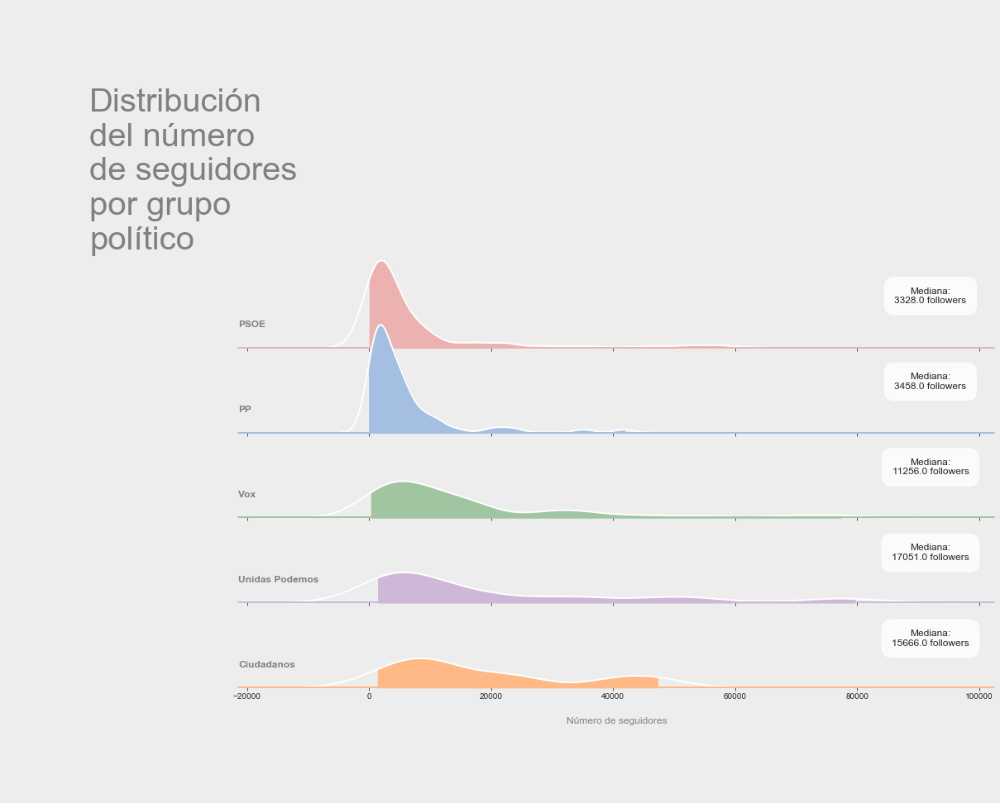

In [1242]:
# Initialize the FacetGrid object
pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
g = sns.FacetGrid(df_prueba_merge[df_prueba_merge['USER_FOLLOWERS_COUNT']<80000],
                  row="LISTA", hue="LISTA", aspect=8, height=1.7, palette=colors_unique_pastel,
                  row_order = order)

# Draw the densities in a few steps
g.map(sns.kdeplot, "USER_FOLLOWERS_COUNT",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1.5, cut=0)
g.map(sns.kdeplot, "USER_FOLLOWERS_COUNT", clip_on=False, color="w", lw=2, bw_adjust=.5)
g.map(plt.axhline, y=0, lw=2, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color='grey', size=12,
            ha="left", va="center", transform=ax.transAxes)


g.map(label, "USER_FOLLOWERS_COUNT")
plt.text(-0.5,0, ".", size=12, transform=ax.transAxes) #padding_left_top
plt.text(1.05,-0.5, ".", size=12, transform=ax.transAxes) #padding_right_bottom
plt.text(0,2.3,
"Distribución\ndel número\nde seguidores\npor grupo\npolítico", size=40, transform=ax.transAxes, color='grey') #Título

# Set the subplots to overlap
g.fig.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
plt.xlabel('Número de seguidores', size=12, color='grey', labelpad=20)
g.set(yticks=[])
g.despine(bottom=True, left=True)


# Anotaciones
eje_y = np.linspace(0.00046, 0.00005, 5)
for i, posicion in enumerate(eje_y):
    plt.text(92000, posicion, 'Mediana:\n{} followers'.format(df_followers_por_grupo.loc[order[i], '50%']),
         bbox=dict(boxstyle="round", fc="w", pad=1, alpha=.8), size=12, ha='center')

##### Número de seguidos y partido político

In [74]:
percentiles = [100, 90, 80, 60, 40, 20]
dicc = {'Percentiles': ['P100', 'P90', 'P80', 'P60', 'P40', 'P20']}

for partido in df_prueba_merge['LISTA'].unique():
    var = df_prueba_merge[df_prueba_merge['LISTA']==partido]['USER_FOLLOWING_COUNT']
    lista_percentiles = []
    for percentil in percentiles:
        lista_percentiles.append(np.percentile(var, percentil))
    dicc[partido] = lista_percentiles

df_percentiles = pd.DataFrame(dicc).set_index('Percentiles').astype(int)
df_percentiles

,Vox,PSOE,PP,Unidas Podemos,Ciudadanos
Percentiles,,,,,
P100,7431,99591,5862,13527,3289
P90,3749,5978,2746,3291,2995
P80,2070,3397,1822,2723,2424
P60,984,1835,1058,2075,1229
P40,567,1071,686,1485,760
P20,329,633,406,752,503


In [75]:
df_following_por_grupo = df_prueba_merge.groupby('LISTA').describe()['USER_FOLLOWING_COUNT'].apply(lambda x: round(x))
df_following_por_grupo

,count,mean,std,min,25%,50%,75%,max
LISTA,,,,,,,,
Ciudadanos,10.00,"1,372.00","1,103.00",174.00,568.00,928.00,"2,086.00","3,289.00"
PP,77.00,"1,269.00","1,173.00",39.00,543.00,886.00,"1,642.00","5,862.00"
PSOE,103.00,"3,323.00","10,083.00",10.00,698.00,"1,522.00","2,410.00","99,591.00"
Unidas Podemos,35.00,"2,229.00","2,351.00",170.00,"1,134.00","1,718.00","2,456.00","13,527.00"
Vox,48.00,"1,386.00","1,628.00",70.00,362.00,739.00,"1,734.00","7,431.00"


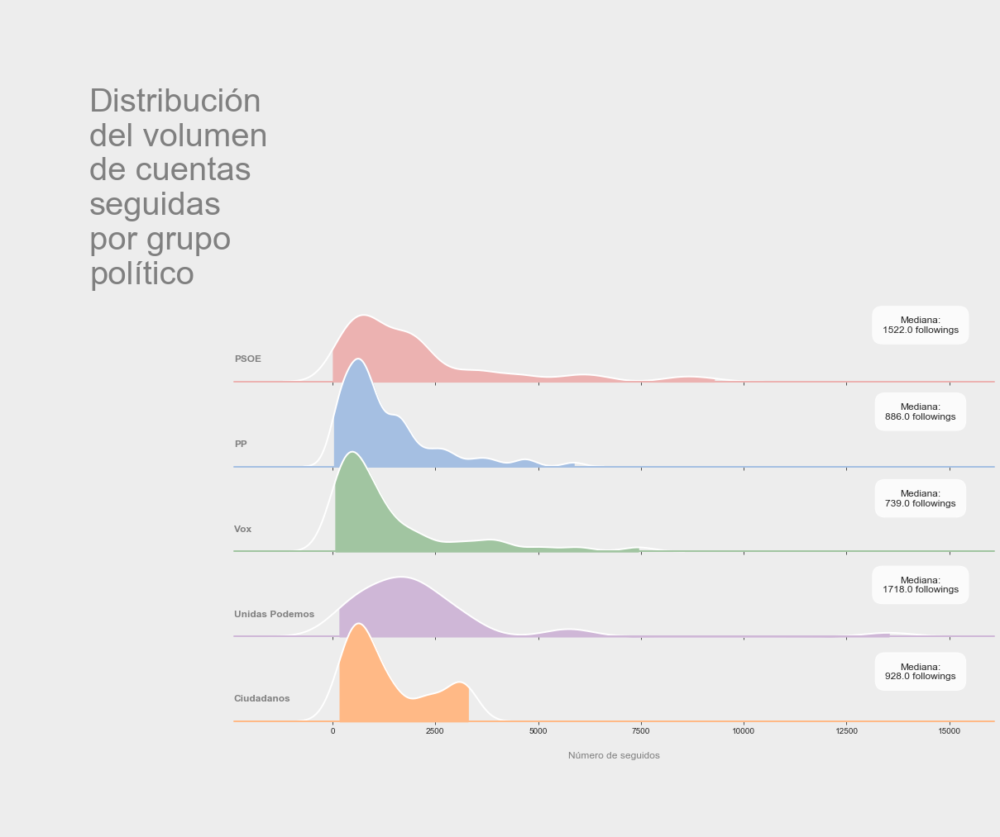

In [1243]:
# Initialize the FacetGrid object
pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
g = sns.FacetGrid(df_prueba_merge[df_prueba_merge['USER_FOLLOWING_COUNT']<15000],
                  row="LISTA", hue="LISTA", aspect=8, height=1.7, palette=colors_unique_pastel,
                  row_order=order)

# Draw the densities in a few steps
g.map(sns.kdeplot, "USER_FOLLOWING_COUNT",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1.5, cut=0)
g.map(sns.kdeplot, "USER_FOLLOWING_COUNT", clip_on=False, color="w", lw=2, bw_adjust=.5)
g.map(plt.axhline, y=0, lw=2, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color='grey', size=12,
            ha="left", va="center", transform=ax.transAxes)


g.map(label, "USER_FOLLOWING_COUNT")
plt.text(-0.5,0.1, ".", size=12, transform=ax.transAxes) #padding_left_top
plt.text(1.05,-0.5, ".", size=12, transform=ax.transAxes) #padding_right_bottom
plt.text(0,2.3,
"Distribución\ndel volumen\nde cuentas\nseguidas\npor grupo\npolítico", size=40, transform=ax.transAxes, color='grey') #Título

# Set the subplots to overlap
g.fig.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
plt.xlabel('Número de seguidos', size=12, color='grey', labelpad=20)
g.set(yticks=[])
g.despine(bottom=True, left=True)

# Anotaciones
eje_y = np.linspace(0.0021, 0.00023, 5)
for i, posicion in enumerate(eje_y):
    plt.text(14300, posicion, 'Mediana:\n{} followings'.format(df_following_por_grupo.loc[order[i], '50%']),
         bbox=dict(boxstyle="round", fc="w", pad=1, alpha=.8), size=12, ha='center')

El grupo Socialista y Unidas Podemos tienen un volumen de cuentas seguidas mucho mayor que el del resto de grupos.

##### Distribución del volumen de tweets por partido

In [77]:
percentiles = [100, 90, 80, 60, 40, 20]
dicc = {'Percentiles': ['P100', 'P90', 'P80', 'P60', 'P40', 'P20']}

for partido in df_prueba_merge['LISTA'].unique():
    var = df_prueba_merge[df_prueba_merge['LISTA']==partido]['TWEETS']
    lista_percentiles = []
    for percentil in percentiles:
        lista_percentiles.append(np.percentile(var, percentil))
    dicc[partido] = lista_percentiles

df_percentiles = pd.DataFrame(dicc).set_index('Percentiles').astype(int)
df_percentiles

,Vox,PSOE,PP,Unidas Podemos,Ciudadanos
Percentiles,,,,,
P100,2551,3128,1640,1605,1770
P90,1582,1032,836,1147,1350
P80,1188,762,613,810,1086
P60,733,315,378,527,616
P40,294,158,166,346,514
P20,75,60,58,162,429


In [78]:
df_prueba_merge['TWEETS'].sum()

130407

In [79]:
df_tweets_por_grupo = df_prueba_merge.groupby(['LISTA']).describe()['TWEETS']
df_tweets_por_grupo

,count,mean,std,min,25%,50%,75%,max
LISTA,,,,,,,,
Ciudadanos,10.00,728.00,501.12,95.00,468.25,537.50,949.25,"1,770.00"
PP,77.00,366.17,362.69,1.00,70.00,311.00,557.00,"1,640.00"
PSOE,103.00,431.66,549.62,1.00,76.50,217.00,543.00,"3,128.00"
Unidas Podemos,35.00,538.03,414.93,58.00,225.00,438.00,693.50,"1,605.00"
Vox,48.00,659.17,636.76,4.00,111.25,469.00,"1,078.00","2,551.00"


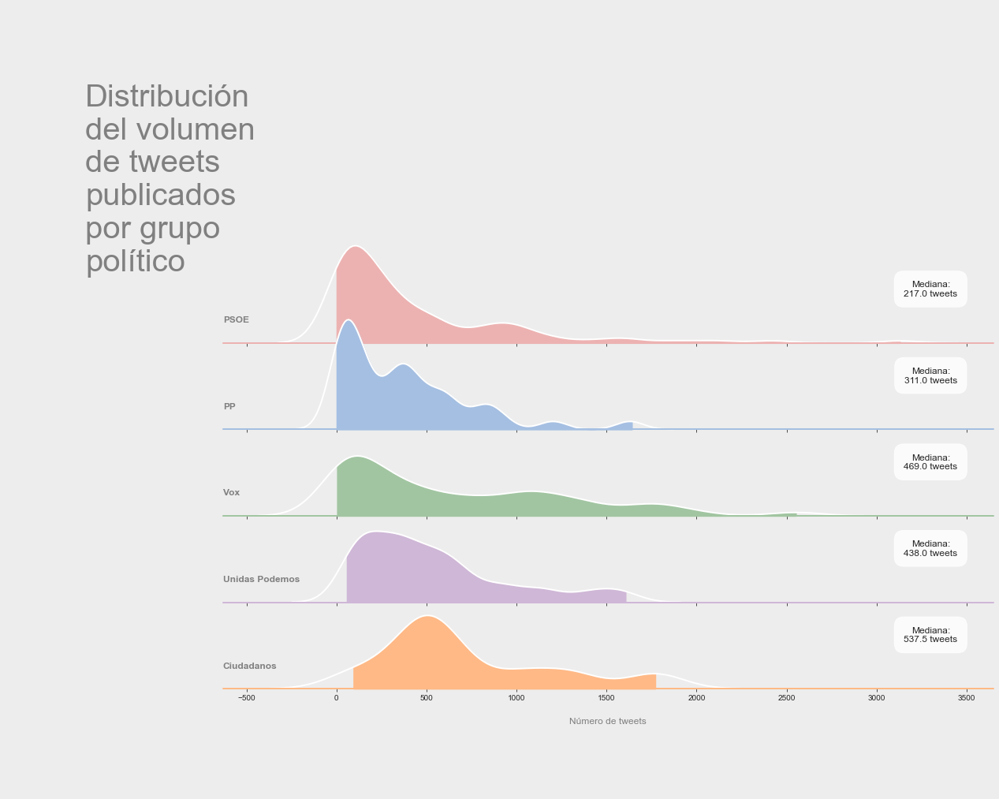

In [1245]:
# Initialize the FacetGrid object
pal = sns.cubehelix_palette(10, rot=-.25, light=.7)
g = sns.FacetGrid(df_prueba_merge,
                  row="LISTA", hue="LISTA", aspect=8, height=1.8, palette=colors_unique_pastel,
                  row_order=order)

# Draw the densities in a few steps
g.map(sns.kdeplot, "TWEETS",
      bw_adjust=.5, clip_on=False,
      fill=True, alpha=1, linewidth=1.5, cut=0)
g.map(sns.kdeplot, "TWEETS", clip_on=False, color="w", lw=2, bw_adjust=.5)
g.map(plt.axhline, y=0, lw=2, clip_on=False)

# Define and use a simple function to label the plot in axes coordinates
def label(x, color, label):
    ax = plt.gca()
    ax.text(0, .2, label, fontweight="bold", color='grey', size=12,
            ha="left", va="center", transform=ax.transAxes)


g.map(label, "TWEETS")
plt.text(-0.5,0.1, ".", size=12, transform=ax.transAxes) #padding_left_top
plt.text(1.05,-0.5, ".", size=12, transform=ax.transAxes) #padding_right_bottom
plt.text(0,2.3,
"Distribución\ndel volumen\nde tweets\npublicados\npor grupo\npolítico", size=40, transform=ax.transAxes, color='grey') #Título

# Set the subplots to overlap
g.fig.subplots_adjust(hspace=-.25)

# Remove axes details that don't play well with overlap
g.set_titles("")
plt.xlabel('Número de tweets', size=12, color='grey', labelpad=20)
g.set(yticks=[])
g.despine(bottom=True, left=True)

# Anotaciones

eje_y = np.linspace(0.0067, 0.0008, 5)
for i, posicion in enumerate(eje_y):
    plt.text(3300, posicion, 'Mediana:\n{} tweets'.format(df_tweets_por_grupo.loc[order[i], '50%']),
         bbox=dict(boxstyle="round", fc="w", pad=1, alpha=.8), size=12, ha='center')

### 2. 9. Volumen de tweets y datos COVID. ¿Existe relación?

##### Analizando gráficamente

Vamos a recoger datos de la pandemia, en concreto número de fallecimientos diario y número de contagios. Estos datos vamos a cruzarlos con los datos recogidos en el análisis para comprobar si existen patrones de conducta.

In [86]:
df_covid = pd.read_csv('datos_ccaas.csv', sep=',')
df_covid = pd.DataFrame(df_covid)

df_covid = df_covid[['ccaa_iso', 'fecha', 'num_casos']]
df_covid['fecha'] = df_covid['fecha'].astype('datetime64')

# Agrupamos por semana
df_covid['fecha_semana'] = df_covid['fecha'].dt.week
df_covid = df_covid.groupby('fecha_semana', as_index=False).sum()


df_covid.head()


,fecha_semana,num_casos
0,5,48
1,6,92
2,7,180
3,8,356
4,9,1937


Cargamos tabla con número de fallecidos:

In [87]:
df_covid_death = pd.read_csv('owid-covid-data.csv', sep=';')
df_covid_death = pd.DataFrame(df_covid_death)

df_covid_death = df_covid_death[df_covid_death['location']=='Spain'][['location', 'date', 'new_deaths', 'new_deaths_smoothed']].reset_index(drop=True)
df_covid_death['new_deaths_smoothed'] = df_covid_death['new_deaths_smoothed'].astype('float64')
df_covid_death['date'] = pd.to_datetime(df_covid_death['date'], format='%d/%m/%Y', errors='raise')

# Agrupamos por semana
df_covid_death['date_week'] = df_covid_death['date'].dt.week
df_covid_death.sort_values('date', inplace=True)

df_covid_death = df_covid_death.groupby('date_week', as_index=False).sum()
df_covid_death.head(5)

,date_week,new_deaths,new_deaths_smoothed
0,1,0.00,0.00
1,2,0.00,0.00
2,3,0.00,0.00
3,4,0.00,0.00
4,5,0.00,0.00


Combinamos en una misma tabla:

In [88]:
df_covid = df_covid.merge(df_covid_death, left_on='fecha_semana', right_on='date_week')
df_covid.drop('date_week', axis=1, inplace=True)

df_covid.head(5)

,fecha_semana,num_casos,new_deaths,new_deaths_smoothed
0,5,48,0.00,0.00
1,6,92,0.00,0.00
2,7,180,0.00,0.00
3,8,356,0.00,0.00
4,9,1937,0.00,0.00


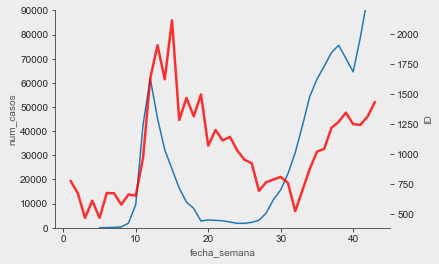

In [89]:
fig, ax = plt.subplots()
sns.lineplot(data=df_covid[df_covid['fecha_semana']<43], x='fecha_semana', y='num_casos', ax=ax)
ax.set_ylim(0, 90000)

ax2 = ax.twinx()
ax2 = sns.lineplot(data=df_vol_tweets_lista[df_vol_tweets_lista['LISTA']=='PSOE'],
             x='CREATED_AT_WEEK', y='ID', palette=colors_unique, alpha=0.8,
             linewidth = 2.5, color='red')


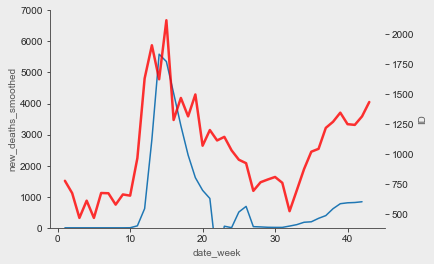

In [90]:
fig, ax = plt.subplots()
sns.lineplot(data=df_covid_death[df_covid_death['date_week']<43], x='date_week', y='new_deaths_smoothed', ax=ax)
ax.set_ylim(0,7000)

ax2 = ax.twinx()
ax2 = sns.lineplot(data=df_vol_tweets_lista[df_vol_tweets_lista['LISTA']=='PSOE'],
             x='CREATED_AT_WEEK', y='ID', palette=colors_unique, alpha=0.8,
             linewidth = 2.5, color='r')

Graficamos los cinco partidos políticos:

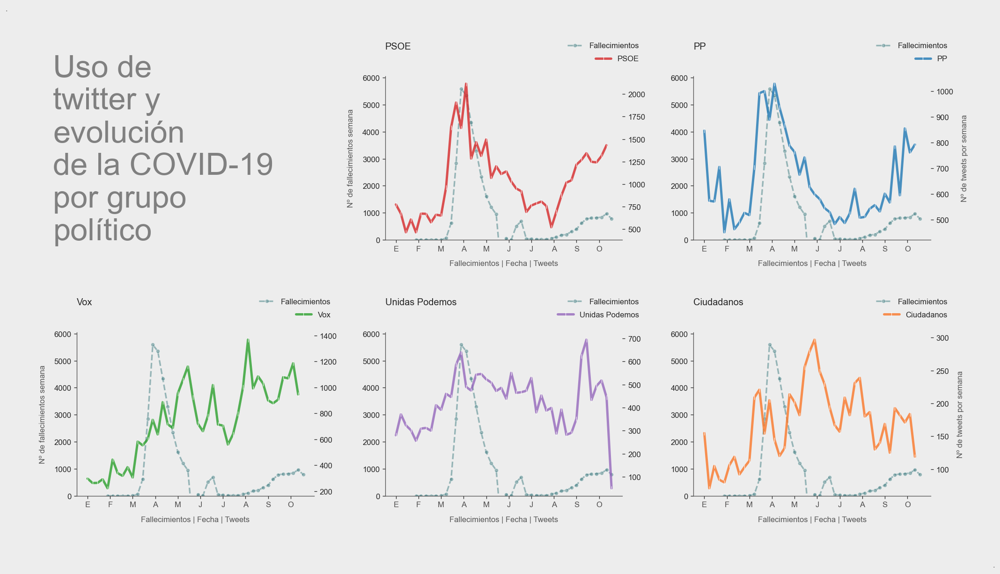

In [91]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=120)
fig.set_size_inches(19, 8)

# Definimos axis
gs = GridSpec(5, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0:2, 0])
axtitulo_inf = fig.add_subplot(gs[2,:])

ax1 = fig.add_subplot(gs[0:2, 1])
ax2 = fig.add_subplot(gs[0:2, 2])
ax3 = fig.add_subplot(gs[3:5, 0])
ax4 = fig.add_subplot(gs[3:5, 1])
ax5 = fig.add_subplot(gs[3:5, 2])

# Títulos
axtitulo.text(-0.1,0,
'Uso de\ntwitter y\nevolución\nde la COVID-19\npor grupo\npolítico', size=40, color='grey')
axtitulo.text(-0.3, 1.4, '.')
axtitulo.text(3.87, -2, '.', ha='right')
axtitulo.axis('off')
axtitulo_inf.axis('off')

# Plot
ax1b, ax2b, ax3b, ax4b, ax5b = None, None, None, None, None
lista_axis = [ax1, ax2, ax3, ax4, ax5]
lista_subaxis = [ax1b, ax2b, ax3b, ax4b, ax5b]
lista_partidos = ['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos']

for index, partido in enumerate(lista_partidos):
    ax = lista_axis[index]
    axb = lista_subaxis[index]
    sns.lineplot(data=df_covid[df_covid['fecha_semana']<45],
                 x='fecha_semana', y='new_deaths_smoothed', ax=ax, alpha=0.5,
                 ls='--', lw=2, color='#3f7c81', legend='auto', label='Fallecimientos', marker='o', markersize=5)

    ax.set_ylim(0, df_covid['new_deaths'].max())
    ax.set_xticks(np.arange(1, 45, step=4.5))
    ax.set_xticklabels(labels=['E', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O'], size=10, color='#4f4e4e')
    ax.set_xlabel('Fallecimientos | Fecha | Tweets', labelpad=10)
    ax.set_title(partido, loc='left', pad=35)
    
    axb = ax.twinx()
    axb = sns.lineplot(data=df_vol_tweets_lista[df_vol_tweets_lista['LISTA']==partido],
                                        x='CREATED_AT_WEEK', y='ID', palette=colors_unique, alpha=0.8,
                                        linewidth = 3, color=colors_unique[partido], marker='|')
    if ax==ax1 or ax==ax3:
        ax.set_ylabel('Nº de fallecimientos semana', labelpad=10)
    else:
        ax.set_ylabel('')
    
    if ax==ax2 or ax==ax5:
        axb.set_ylabel('Nº de tweets por semana', labelpad=10)
    else:
        axb.set_ylabel('')

    ax.legend([ax, axb], labels=['Fallecimientos', 'as'], loc='upper right', bbox_to_anchor=(1.1,1.25,0,0))
    plt.legend(labels=[partido], loc='upper right', bbox_to_anchor=(1.1,1.17,0,0))
    sns.despine(left=False, bottom=False, right=True)


    

##### Analizando la correlación

Estudiamos la relación entre fallecimientos y número de tweets:

In [94]:
df_tweets_por_fallecidos = tweetsdip[['LISTA', 'ID', 'CREATED_AT_DATE']]

# Sacamos el número de semana para poder agrupar
df_tweets_por_fallecidos['CREATED_AT_WEEK'] = df_tweets_por_fallecidos['CREATED_AT_DATE'].dt.week
df_tweets_por_fallecidos.drop('CREATED_AT_DATE', axis=1, inplace=True)

df_tweets_por_fallecidos = df_tweets_por_fallecidos.groupby(['LISTA', 'CREATED_AT_WEEK'], as_index=False).count()

# Añadimos número de fallecimientos y contagios
df_tweets_por_fallecidos = df_tweets_por_fallecidos.merge(df_covid, left_on='CREATED_AT_WEEK', right_on='fecha_semana')
df_tweets_por_fallecidos.drop(['fecha_semana', 'new_deaths_smoothed'], 1, inplace=True)

# Estudiamos la correlación:
# Creamos dataframe con la correlación emtre el número de
# tweets por partido y los fallecimientos y contagios
# de la covid-19 antes y después del fin del estado de alarma

df_tweets_por_fallecidos[(df_tweets_por_fallecidos['LISTA']=='PSOE') &\
                         (df_tweets_por_fallecidos['CREATED_AT_WEEK'].between(9, 26))].corr()['ID']

lista_partidos = ['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos']

corr_ea = [df_tweets_por_fallecidos[(df_tweets_por_fallecidos['LISTA']==partido) &\
                         (df_tweets_por_fallecidos['CREATED_AT_WEEK']<26)].corr()['ID'] for partido in lista_partidos]

corr_post_ea = [df_tweets_por_fallecidos[(df_tweets_por_fallecidos['LISTA']==partido) &\
                         (df_tweets_por_fallecidos['CREATED_AT_WEEK']>=26)].corr()['ID'] for partido in lista_partidos]

pd_correlacion_ea = pd.concat(corr_ea, axis=1, keys=[partido for partido in lista_partidos])
pd_correlacion_ea.drop(['CREATED_AT_WEEK', 'ID'], 0, inplace=True)
pd_correlacion_ea.index.name = 'Correlación durante EA'

pd_correlacion_post_ea = pd.concat(corr_post_ea, axis=1, keys=[partido for partido in lista_partidos])
pd_correlacion_post_ea.drop(['CREATED_AT_WEEK', 'ID'], 0, inplace=True)
pd_correlacion_post_ea.index.name = 'Correlación post EA'

In [95]:
df_tweets_por_fallecidos[(df_tweets_por_fallecidos['LISTA']=='PP') &\
                         (df_tweets_por_fallecidos['CREATED_AT_WEEK']<26)].corr()

,CREATED_AT_WEEK,ID,num_casos,new_deaths
CREATED_AT_WEEK,1.00,0.19,-0.16,0.06
ID,0.19,1.00,0.72,0.79
num_casos,-0.16,0.72,1.00,0.48
new_deaths,0.06,0.79,0.48,1.00


In [96]:
display(pd_correlacion_ea)
display(pd_correlacion_post_ea)

,PSOE,PP,Vox,Unidas Podemos,Ciudadanos
Correlación durante EA,,,,,
num_casos,0.61,0.72,-0.03,0.38,0.11
new_deaths,0.76,0.79,0.25,0.62,-0.10


,PSOE,PP,Vox,Unidas Podemos,Ciudadanos
Correlación post EA,,,,,
num_casos,0.84,0.73,0.51,0.21,-0.49
new_deaths,0.91,0.80,0.38,0.01,-0.42


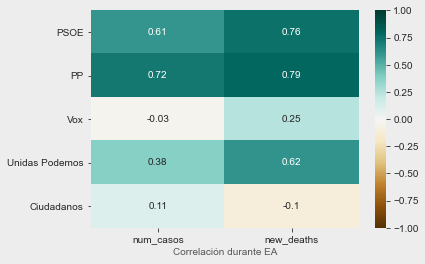

In [97]:
sns.heatmap(pd_correlacion_ea.T, vmin=-1, vmax=1, cmap='BrBG', annot=True)

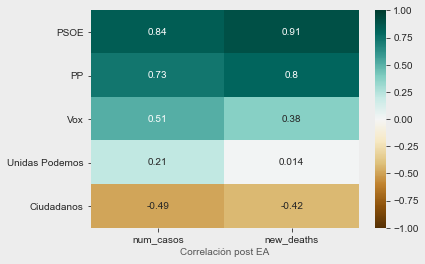

In [98]:
sns.heatmap(pd_correlacion_post_ea.T, vmin=-1, vmax=1, cmap='BrBG', annot=True)

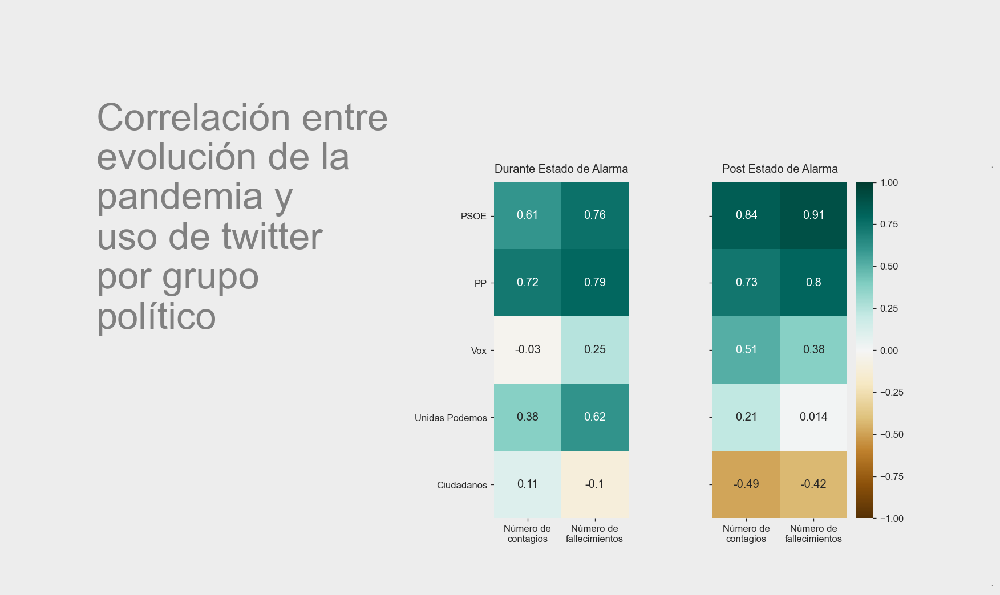

In [99]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=120)
fig.set_size_inches(16, 8)

# Definimos axis
gs = GridSpec(3, 4, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0:1, 0])

ax1 = fig.add_subplot(gs[1:3, 2])
ax2 = fig.add_subplot(gs[1:3, 3])

# Título
axtitulo.text(0.5,-1,
'Correlación entre\nevolución de la\npandemia y\nuso de twitter\npor grupo\npolítico', size=40, color='grey')
axtitulo.text(5.5,0, '.', size=12, color='grey')
axtitulo.text(5.5,-2.6, '.', size=12, color='grey')

axtitulo.axis('off')

# Ploting
sns.heatmap(pd_correlacion_ea.T, vmin=-1, vmax=1, cmap='BrBG', annot=True, ax=ax1, cbar=False, square=True, annot_kws={"size":12})
sns.heatmap(pd_correlacion_post_ea.T, vmin=-1, vmax=1, cmap='BrBG', annot=True, ax=ax2, square=True, annot_kws={"size":12})

ax1.set_title('Durante Estado de Alarma', pad=10)
ax1.set_xlabel('')
ax1.set_xticklabels(['Número de\ncontagios', 'Número de\nfallecimientos'])

ax2.set_title('Post Estado de Alarma', pad=10)
ax2.set_xlabel('')
ax2.set_yticklabels('')
ax2.set_xticklabels(['Número de\ncontagios', 'Número de\nfallecimientos'])

plt.show();


##### ¿Ha cambiado la viralidad de los partidos conforme avanzaba la pandemia?

A nivel mediático, ¿ha funcionado el trampolín que suponía la pandemia como argumentario?
Vamos a comprobar ahora el engagement de cada partido conforme evolucionaba la pandemia:

In [101]:
df_engagement = tweetsdip[['ID', 'LISTA', 'RETWEET_COUNT', 'FAVORITE_COUNT', 'CREATED_AT_DATE']]

# Transformamos fecha
df_engagement['CREATED_AT_WEEK'] = df_engagement['CREATED_AT_DATE'].dt.week
#df_engagement.drop('CREATED_AT_DATE', 1, inplace=True)

# Transformamos 'ID' de modo que cada tweet sea 1
df_engagement.loc[:, 'ID'] = 1

# Agrupamos por semana y lista
df_engagement = df_engagement.groupby(['CREATED_AT_WEEK', 'LISTA'], as_index=False).sum()

# Calculamos el engagement
#df_engagement['ENGAGEMENT'] = df_engagement['ID'] / (df_engagement['RETWEET_COUNT'] + df_engagement['FAVORITE_COUNT']) * 100
df_engagement['ENGAGEMENT'] = (df_engagement['RETWEET_COUNT'] + df_engagement['FAVORITE_COUNT']) / df_engagement['ID']
df_engagement

,CREATED_AT_WEEK,LISTA,ID,RETWEET_COUNT,FAVORITE_COUNT,ENGAGEMENT
0,1,Ciudadanos,155,66202,156314,"1,435.59"
1,1,PP,846,83656,178145,309.46
2,1,PSOE,775,53748,143737,254.82
3,1,Unidas Podemos,280,190965,595214,"2,807.78"
4,1,Vox,296,131550,260144,"1,323.29"
...,...,...,...,...,...,...
211,43,PP,792,47746,126620,220.16
212,43,PSOE,1433,46326,137213,128.08
213,43,Unidas Podemos,445,92166,287672,853.57
214,43,Vox,945,169785,497547,706.17


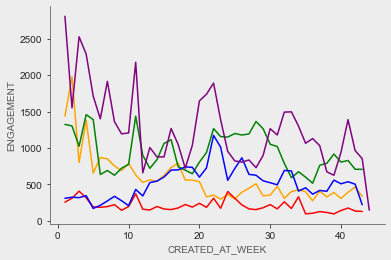

In [103]:
sns.lineplot(data=df_engagement[df_engagement['LISTA']=='Ciudadanos'], x='CREATED_AT_WEEK', y='ENGAGEMENT', c='orange')
sns.lineplot(data=df_engagement[df_engagement['LISTA']=='Vox'], x='CREATED_AT_WEEK', y='ENGAGEMENT', c='g')
sns.lineplot(data=df_engagement[df_engagement['LISTA']=='PSOE'], x='CREATED_AT_WEEK', y='ENGAGEMENT', c='r')
sns.lineplot(data=df_engagement[df_engagement['LISTA']=='PP'], x='CREATED_AT_WEEK', y='ENGAGEMENT', c='blue')
sns.lineplot(data=df_engagement[df_engagement['LISTA']=='Unidas Podemos'], x='CREATED_AT_WEEK', y='ENGAGEMENT', c='purple')


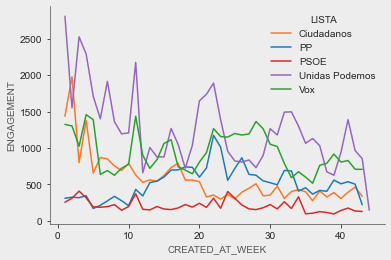

In [104]:
sns.lineplot(data=df_engagement, x='CREATED_AT_WEEK', y='ENGAGEMENT', hue='LISTA', c='orange', palette=colors_unique)

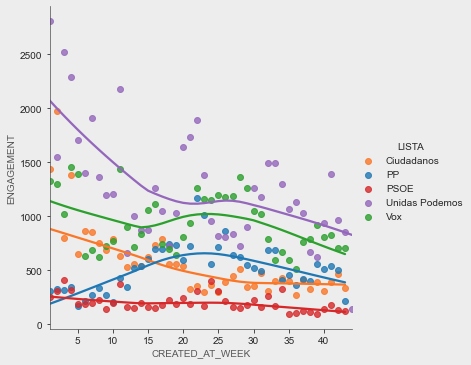

In [106]:
sns.lmplot(x="CREATED_AT_WEEK", y="ENGAGEMENT", data=df_engagement, hue='LISTA', col_order=order, lowess=True, palette=colors_unique)

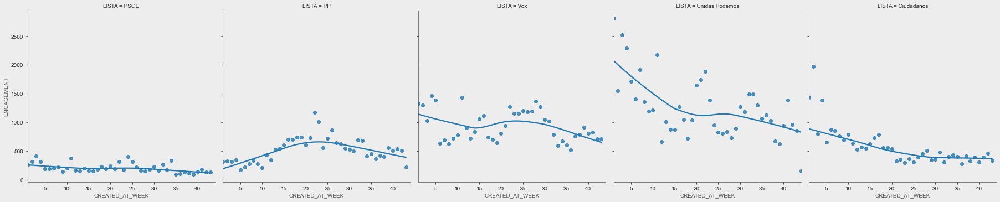

In [107]:
sns.lmplot(x="CREATED_AT_WEEK", y="ENGAGEMENT", data=df_engagement, col='LISTA', col_order=order, lowess=True)

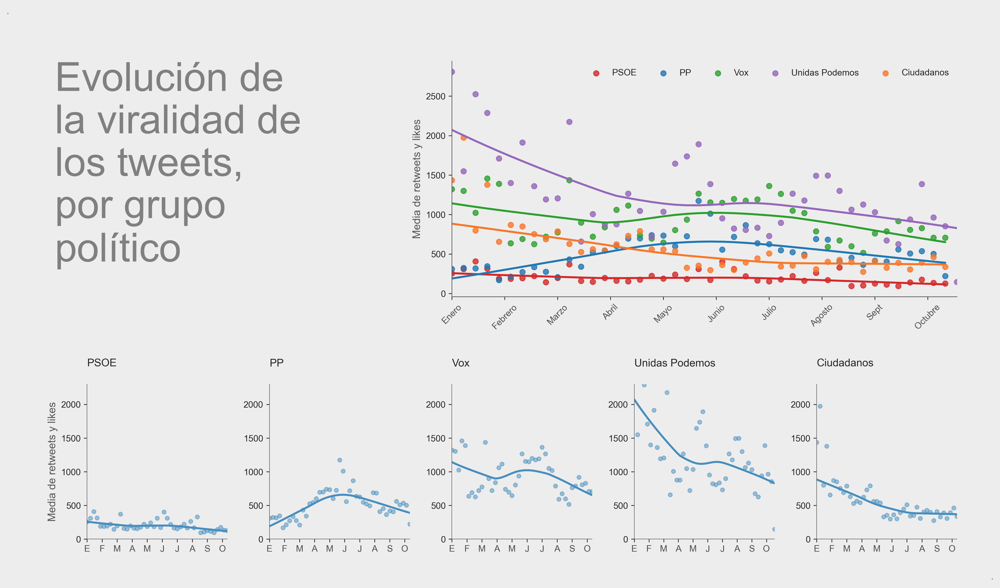

In [108]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=300)
fig.set_size_inches(17, 8)

# Definimos axis
gs = GridSpec(6, 5, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0:3, 0:2])
ax1 = fig.add_subplot(gs[0:3, 2:5])
axcenter = fig.add_subplot(gs[3, 0:2])
ax2 = fig.add_subplot(gs[4:6, 0])
ax3 = fig.add_subplot(gs[4:6, 1])
ax4 = fig.add_subplot(gs[4:6, 2])
ax5 = fig.add_subplot(gs[4:6, 3])
ax6 = fig.add_subplot(gs[4:6, 4])


# Título
axtitulo.text(-0.1,0.15,
'Evolución de\nla viralidad de\nlos tweets,\npor grupo\npolítico', color='grey', size=45)
axtitulo.text(-0.25,1.2,'.', color='grey', size=12)
axtitulo.text(2.8,-1.2,'.', color='grey', size=12)
axcenter.axis('off')
axtitulo.axis('off')

# Ploting top
lista_partidos = ['PSOE', 'PP', 'Vox', 'Unidas Podemos', 'Ciudadanos']

for i, partido in enumerate(lista_partidos): 
    g = sns.regplot(x="CREATED_AT_WEEK", y="ENGAGEMENT",
                data=df_engagement[df_engagement['LISTA']==partido], lowess=True,
                ax=ax1, color=colors_unique[partido], label=partido)
g.legend(ncol=5)
ax1.set_xticks(np.arange(1, 45, step=4.5))
ax1.set_xticklabels(labels=labels_meses, rotation=45, size=10, color='#4f4e4e')
ax1.set_xlabel('')
ax1.set_ylabel('Media de retweets y likes', size=12)

# Ploting sub
lista_axis = [ax2, ax3, ax4, ax5, ax6]
for i, partido in enumerate(lista_partidos):
    ax = lista_axis[i]
    sns.regplot(x="CREATED_AT_WEEK", y="ENGAGEMENT",
                data=df_engagement[df_engagement['LISTA']==partido], lowess=True,
                ax=ax, color='#478EBF', scatter_kws={'s':20, 'alpha':0.5})
    if ax!=ax2:
        ax.set_ylabel('')
    else:
        ax.set_ylabel('Media de retweets y likes', size=12)
        
    ax.set_xticks(np.arange(1, 45, step=4.5))
    ax.set_xticklabels(labels=['E', 'F', 'M', 'A', 'M', 'J', 'J', 'A', 'S', 'O'], size=10, color='#4f4e4e')
    ax.spines['left'].set_linewidth(0.5)    
    ax.spines['bottom'].set_linewidth(0.5)    

    ax.set_ylim(0, 2300)
    ax.set_xlabel('')
    ax.set_title(partido, pad=20, loc='left')

Pese a que Vox llegó a triplicar el volumen de tweets, no ha sido igual con el volumen de retweets y favoritos conseguido, que ha ido disminuyendo desde junio. Todos los grupos, salvo Ciudadanos, sufren un descenso en el engagement de sus publicaciones, entendiéndose engagement como la reacción de la audiencia a una determinada publicación.

## 3. Análisis cualitativo de partido

### 3. 1. Tweets virales por partido

Volvemos al dataframe original para rescatar alguna información que quedó perdida. Vamos a recuperar el nombre de twitter de perfil de cada usuario, que es distinto al USER_SCREEN_NAME, y que puede contener alguna información interesante. Además, nos va a servir para visualizar mejor a cada una de las cuentas.

In [109]:
df_user_name = df_tweets_diputados[['ID', 'USER']]
df_user_name['ID'] = df_user_name['ID'].astype(str)

df_user_name['USER_NAME'] = df_user_name['USER'].apply(lambda x: x.split("'name': '")[1].split("', 'screen_name'")[0])

# Combinamos en tweetsdip
tweetsdip = tweetsdip.merge(df_user_name[['ID', 'USER_NAME']], on='ID')
                                   

Vamos a crear un subdataframe con los top-tweets:

In [110]:
df_top_tweets = tweetsdip

df_top_tweets.head(3)

,ID,CREATED_AT,FULL_TEXT,IS_QUOTE,RETWEET_COUNT,FAVORITE_COUNT,POSSIBLE_SENSITIVE,IN_REPLY_TO_STATUS_ID,IN_REPLY_TO_USER_ID,IN_REPLY_TO_SCREEN_NAME,HASHTAGS,USER_MENTIONS,URLS,MEDIA_URL,USER_ID,USER_SCREEN_NAME,USER_DESCRIPTION,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_CREATED_AT,USER_TWEET_COUNT,CREATED_AT_DATE,CREATED_AT_HOUR,LISTA,NOMBRE_APELLIDOS,SEXO,EDAD,IS_TOP_TWEET,CREATED_AT_DWEEK,USER_NAME
0,1319175784267976706,2020-10-22 07:16:30,📺En unos minutos seré entrevistado en @LaHoraT...,True,14,28,False,nan,nan,None,[],"[{'screen_name': 'LaHoraTVE', 'name': 'La Hora...","[{'url': 'https://t.co/5Frfhxny4Z', 'expanded_...",None,202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13,18527,2020-10-22,07:16:30,PSOE,José Luis Ábalos Meco,Hombre,61,False,3,José Luis Ábalos
1,1318920807737937923,2020-10-21 14:23:19,.@sanchezcastejon a Casado:\nLe pido que no re...,False,164,292,False,nan,nan,None,"[{'text': 'MociónDeCensura', 'indices': [189, ...","[{'screen_name': 'sanchezcastejon', 'name': 'P...",[],"[{'id': 1318920732173357059, 'id_str': '131892...",202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13,18527,2020-10-21,14:23:19,PSOE,José Luis Ábalos Meco,Hombre,61,False,2,José Luis Ábalos
2,1318904449784598532,2020-10-21 13:18:19,Usted odia a España tal y como es. A un patrio...,False,449,1044,False,nan,nan,None,"[{'text': 'EspañaPuedeConVox', 'indices': [244...","[{'screen_name': 'sanchezcastejon', 'name': 'P...",[],"[{'id': 1318903990843772930, 'id_str': '131890...",202372417,abalosmeco,Ministro de @mitmagob del Gobierno de España. ...,81414,1933,2010-10-13,18527,2020-10-21,13:18:19,PSOE,José Luis Ábalos Meco,Hombre,61,True,2,José Luis Ábalos


#### a. Distribución del número de retweets por líder político

In [1274]:
lideres = ['sanchezcastejon', 'pablocasado_', 'Santi_ABASCAL', 'PabloIglesias', 'InesArrimadas']

df_top_tweets[df_top_tweets['USER_SCREEN_NAME'].isin(lideres)].groupby('USER_SCREEN_NAME',
                                                                       as_index=False).mean()[['USER_SCREEN_NAME',
                                                                                               'RETWEET_COUNT',
                                                                                               'FAVORITE_COUNT',
                                                                                               'USER_FOLLOWERS_COUNT',
                                                                                               'USER_FOLLOWING_COUNT',
                                                                                               'USER_TWEET_COUNT',
                                                                                               'IS_TOP_TWEET']]

,USER_SCREEN_NAME,RETWEET_COUNT,FAVORITE_COUNT,USER_FOLLOWERS_COUNT,USER_FOLLOWING_COUNT,USER_TWEET_COUNT,IS_TOP_TWEET
0,InesArrimadas,745.87,"2,226.79","685,157.90","1,474.00","6,111.00",0.66
1,PabloIglesias,"1,711.70","6,077.84","2,613,768.64","3,244.00","23,427.00",0.74
2,Santi_ABASCAL,"3,942.48","8,930.97","524,925.44","3,950.00","30,974.11",0.99
3,pablocasado_,855.50,"2,117.35","502,562.47","5,862.00","14,999.00",0.72
4,sanchezcastejon,686.42,"2,413.76","1,478,013.99","6,045.00","28,239.00",0.77


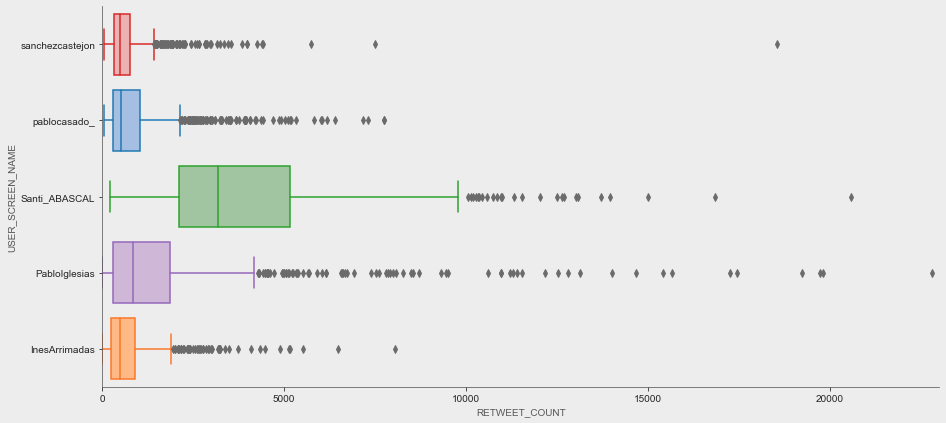

In [1279]:
# Distribución del número de retweets por tweet en Líderes
lideres = ['sanchezcastejon', 'pablocasado_', 'Santi_ABASCAL', 'PabloIglesias', 'InesArrimadas']
colores_lideres = ['#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986']
colores_lideres_str = ['#D62829', '#1F78B4', '#2BA02D', '#9467BC', '#fa7728']

plt.figure(figsize=(15,7))
box_plot_rt = sns.boxplot(data=df_top_tweets[df_top_tweets['USER_SCREEN_NAME'].isin(lideres)],
            y='USER_SCREEN_NAME', x='RETWEET_COUNT', order=lideres, palette=colores_lideres,
                         medianprops={'color':'#ededed'})

for i,box in enumerate(box_plot_rt.artists):
    box.set_edgecolor(colores_lideres_str[i])
    box.set_facecolor(colores_lideres[i])
    for q in range(i*6, i*6+6):
        line = box_plot_rt.lines[q]
        line.set_color(colores_lideres_str[i])


    
plt.xlim(0, 23000);

Santiago Abascal, con gran diferencia, es el líder político con mayor número de retweet conseguido de media por cada publicación, pese a tener 5 veces menos seguidores que el segundo.

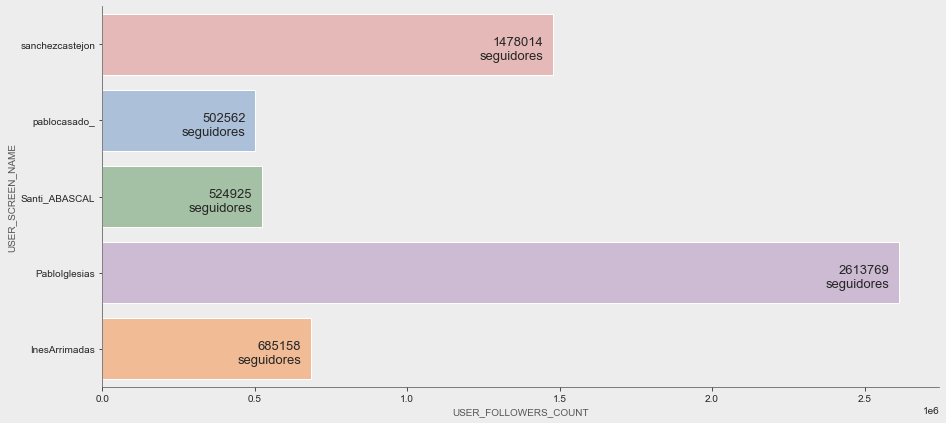

In [1310]:
# Distribución del número de retweets por tweet en Líderes
lideres = ['sanchezcastejon', 'pablocasado_', 'Santi_ABASCAL', 'PabloIglesias', 'InesArrimadas']
colores_lideres = ['#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986']
colores_lideres_str = ['#D62829', '#1F78B4', '#2BA02D', '#9467BC', '#fa7728']

plt.figure(figsize=(15,7))
bar_plot_rt = sns.barplot(data=df_top_tweets[df_top_tweets['USER_SCREEN_NAME'].isin(lideres)],
            y='USER_SCREEN_NAME', x='USER_FOLLOWERS_COUNT', order=lideres, palette=colores_lideres);


for barra in bar_plot_rt.patches:
    bar_plot_rt.annotate("{:.0f}\nseguidores".format(barra.get_width()), 
                   (barra.get_width(), barra.get_y()), 
                   ha = 'right', va = 'center', 
                   size=13,
                   xytext = (-10, -35), 
                   textcoords = 'offset points')

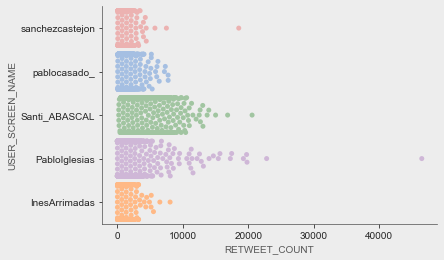

In [336]:
swarm_plot_rt = sns.swarmplot(data=df_top_tweets[df_top_tweets['USER_SCREEN_NAME'].isin(lideres)],
            y='USER_SCREEN_NAME', x='RETWEET_COUNT', order=lideres, palette=colores_lideres)

#### b. Top de diputados por número de retweets

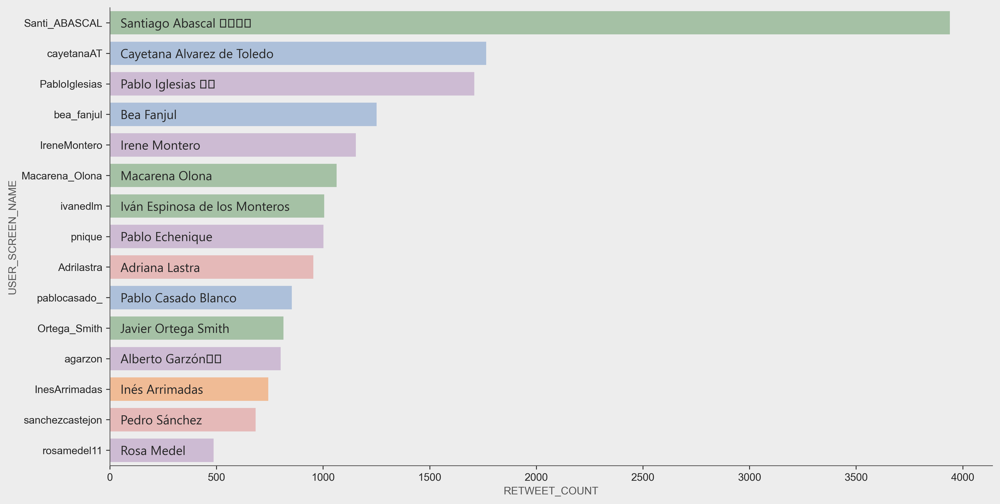

In [120]:
import emoji
from matplotlib.font_manager import FontProperties

'''prop = FontProperties(fname='C:/Windows/Fonts/seguiemj.ttf')
plt.rcParams['font.family'] = prop.get_name()
plt.rcParams.update({
                'font.family' : 'Segoe UI Emoji',
                'font.sans-serif' : 'Segoe UI Emoji'})'''


r,b,g,p,o = '#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986'
lista_colores_fake = [g, b, p, b, p, g, g, p, r, b, g, p, o, r, p]

plt.figure(figsize=(15, 8), dpi=300)
barplot_top_tweets = sns.barplot(data=df_top_twitters, x='RETWEET_COUNT', y='USER_SCREEN_NAME',
                                 palette=lista_colores_fake, edgecolor='#ededed')

for index, barra in enumerate(barplot_top_tweets.patches):
    #print(barra)
    barplot_top_tweets.annotate(list(df_top_twitters['USER_NAME'])[index], 
                   (barra.get_x(), barra.get_y()), 
                   ha = 'left', va = 'center', 
                   size=12,
                   xytext = (10, -13), 
                   textcoords = 'offset points',
                                fontname='Segoe UI Emoji')
    

#### c. Top por ratio de tweets dentro de los más virales:

In [121]:
df_is_top_tweet = df_top_tweets[['ID', 'LISTA', 'USER_NAME', 'USER_SCREEN_NAME', 'IS_TOP_TWEET', 'SEXO']]
df_is_top_tweet.loc[:, 'ID'] = 1

df_is_top_tweet = pd.pivot_table(df_is_top_tweet, values='ID',
                                 index=['LISTA', 'USER_NAME', 'USER_SCREEN_NAME', 'SEXO'],
                                 columns='IS_TOP_TWEET', aggfunc=np.sum).reset_index()

df_is_top_tweet['TOP_TWEETS_PER'] = df_is_top_tweet[True] / (df_is_top_tweet[False] + df_is_top_tweet[True])
df_is_top_tweet = df_is_top_tweet.sort_values('TOP_TWEETS_PER', ascending=False)
df_is_top_tweet[:15]

IS_TOP_TWEET,LISTA,USER_NAME,USER_SCREEN_NAME,SEXO,False,True,TOP_TWEETS_PER
267,Vox,Santiago Abascal 🇪🇸,Santi_ABASCAL,Hombre,6.00,751.00,0.99
28,PP,Cayetana Alvarez de Toledo,cayetanaAT,Mujer,97.00,347.00,0.78
239,Vox,Javier Ortega Smith,Ortega_Smith,Hombre,67.00,228.00,0.77
165,PSOE,Pedro Sánchez,sanchezcastejon,Hombre,211.00,701.00,0.77
213,Unidas Podemos,Pablo Iglesias 🔻,PabloIglesias,Hombre,240.00,676.00,0.74
199,Unidas Podemos,Irene Montero,IreneMontero,Mujer,109.00,291.00,0.73
63,PP,Pablo Casado Blanco,pablocasado_,Hombre,328.00,864.00,0.72
212,Unidas Podemos,Pablo Echenique,pnique,Hombre,452.00,"1,048.00",0.70
2,Ciudadanos,Inés Arrimadas,InesArrimadas,Mujer,237.00,464.00,0.66
238,Vox,Iván Espinosa de los Monteros,ivanedlm,Hombre,448.00,639.00,0.59


#### d. Distribución de tweets virales por grupo

Text(0, 0.5, '')

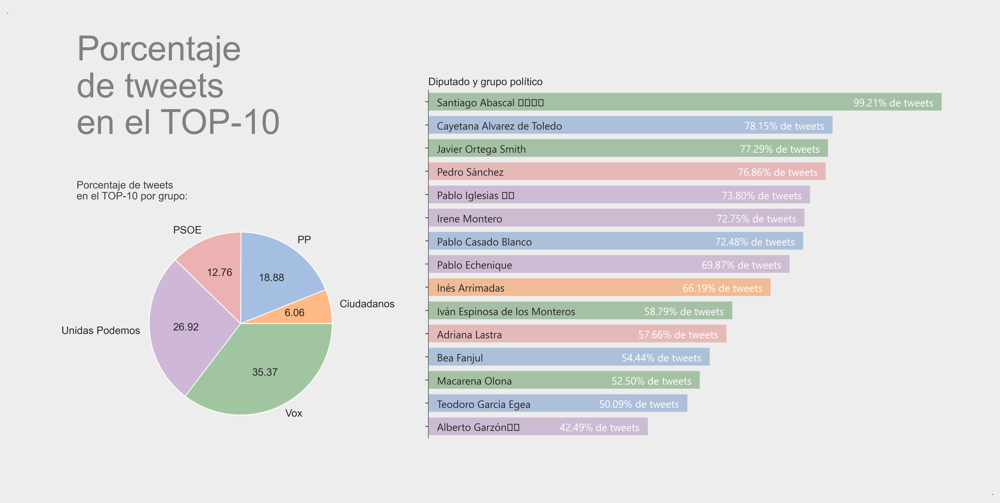

<Figure size 4500x2400 with 0 Axes>

In [234]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=300)
fig.set_size_inches(17, 6)

# Definimos axis
gs = GridSpec(3, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[:, 1:3])
ax2 = fig.add_subplot(gs[1:3, 0])

r,b,g,p,o = '#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986'
lista_colores_fake = [g, b, g, r, p, p, b, p, o, g, r, b, g, b, p]

# Título
axtitulo.text(-0.2,0.6,'Porcentaje\nde tweets\nen el TOP-10', size=40, color='grey')
axtitulo.text(-0.2,0.0,'Porcentaje de tweets\nen el TOP-10 por grupo:', size=12, color='#3e3e3e')
axtitulo.text(-0.5,1.7,'.', size=12, color='grey')
axtitulo.text(3.7,-2.7,'.', size=12, color='grey')

axtitulo.axis('off')

# Ploting
plt.figure(figsize=(15, 8), dpi=300)
barplot_top_tweets = sns.barplot(data=df_is_top_tweet[:15], x='TOP_TWEETS_PER', y='USER_SCREEN_NAME',
                                 palette=lista_colores_fake, edgecolor='#ededed', ax=ax1)
ax1.set_yticklabels(labels='')
ax1.set_xticklabels(labels='')
ax1.axes.get_xaxis().set_visible(False)
ax1.set_title('Diputado y grupo político', loc='left')
ax1.set_xlabel('')
ax1.set_ylabel('')

for index, barra in enumerate(barplot_top_tweets.patches):
    #print(barra)
    barplot_top_tweets.annotate(list(df_is_top_tweet['USER_NAME'])[index], 
                   (barra.get_x(), barra.get_y()), 
                   ha = 'left', va = 'center', 
                   size=12,
                   xytext = (10, -13), 
                   textcoords = 'offset points',
                                fontname='Segoe UI Emoji')
    barplot_top_tweets.annotate("{:.2f}% de tweets".format(list(df_is_top_tweet['TOP_TWEETS_PER'])[index]*100), 
                                (barra.get_width(), barra.get_y()), 
                                ha = 'right', va = 'center', 
                                size=12,
                                color='w',
                                weight='bold',
                                xytext = (-10, -13), 
                                textcoords = 'offset points',
                                fontname='Segoe UI Emoji')
sns.despine(ax=ax1, bottom=True)

# Bar plot
lista_colores = ['#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986']
lista_colores = ['#ffb986', '#a5bfe2', '#ecb2b1', '#cfb7d7', '#a1c5a1']

data = df_is_top_tweet.groupby('LISTA', as_index=True).sum()[True]
pie_chart = data.plot.pie(ax=ax2, autopct='%.2f', fontsize=12)

for i, barra in enumerate(pie_chart.patches):
    barra.set_color(lista_colores[i])
    barra.set_edgecolor('w')
'''    pie_chart.annotate('{:.2f}%'.format(data[i]/data.sum()*100),
                       #(barra.get_theta1(), barra.get_theta2()),
                       ha = 'left', va = 'center',
                       size=12,
                      xy=(0, 0),
                      textcoords = 'offset points')'''
ax2.set_ylabel('')


### 3. 2. Distribución de tweets virales por grupo y diputado

Vamos los diputados más influyentes para cada partido:

**PSOE**:

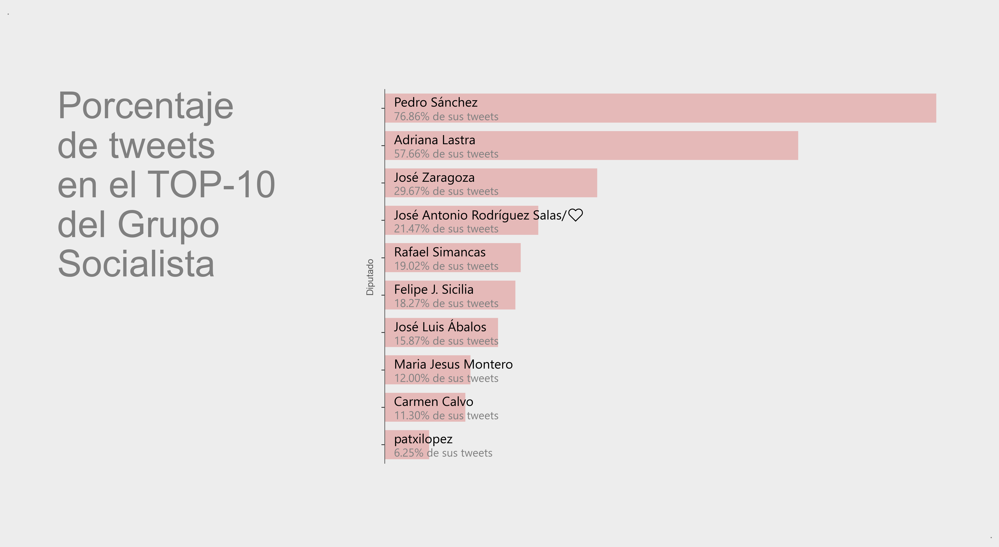

<Figure size 4500x2400 with 0 Axes>

In [411]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=300)
fig.set_size_inches(17, 6)

# Definimos axis
gs = GridSpec(1, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1:3])

r,b,g,p,o = '#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986'
lista_colores_fake = [g, b, g, r, p, p, b, p, o, g, r, b, g, b, p]
lista_colores_psoe = ['#d93b3c', '#db4a4a', '#dd5353',
                      '#df6060',  '#e16d6d', '#e27575', '#e4807f',
                      '#e68d8c', '#e89695', '#ecb2b1', '#f3c5c5']

# Título
axtitulo.text(0,0.5,'Porcentaje\nde tweets\nen el TOP-10\ndel Grupo\nSocialista', size=40, color='grey')
axtitulo.text(-0.2,1.2,'.', size=12, color='grey')
axtitulo.text(3.7,-0.2,'.', size=12, color='grey')

axtitulo.axis('off')

# Ploting
# Metemos en una función porque vamos a emplearlo más veces
def top_twitters(partido):
    
    # Preparamos data
    
    # Creamos figura
    data = df_is_top_tweet[df_is_top_tweet['LISTA']==partido][:10]
    plt.figure(figsize=(15, 8), dpi=300)
    barplot_top_tweets = sns.barplot(data=data, x='TOP_TWEETS_PER', y='USER_SCREEN_NAME',
                                     color=colors_unique_pastel[partido], edgecolor='#ededed', ax=ax1)
    ax1.set_yticklabels(labels='')
    ax1.set_xticklabels(labels='')
    ax1.axes.get_xaxis().set_visible(False)
    ax1.set_ylabel('Diputado')
    ax1.set_xlabel('')

    for index, barra in enumerate(barplot_top_tweets.patches):
        #print(barra)
        barplot_top_tweets.annotate(list(data['USER_NAME'])[index], 
                       (barra.get_x(), barra.get_y()), 
                       ha = 'left', va = 'center', c='k',
                       size=14,
                       xytext = (10, -11), 
                       textcoords = 'offset points',
                                    fontname='Segoe UI Emoji')
        barplot_top_tweets.annotate("{:.2f}% de sus tweets".format(list(data['TOP_TWEETS_PER'])[index]*100), 
                                    (barra.get_x(), barra.get_y()), 
                                    ha = 'left', va = 'center', 
                                    size=12,
                                    color='grey',
                                    weight='bold',
                                    xytext = (10, -26), 
                                    textcoords = 'offset points',
                                    fontname='Segoe UI Emoji')
    sns.despine(ax=ax1, bottom=True)

top_twitters('PSOE')

**PP**:

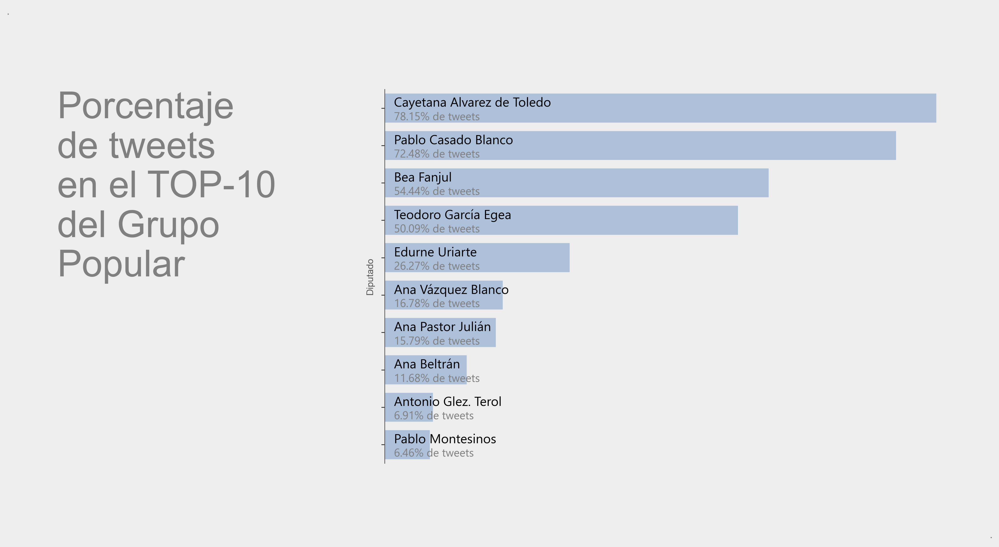

<Figure size 4500x2400 with 0 Axes>

In [137]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=300)
fig.set_size_inches(17, 6)

# Definimos axis
gs = GridSpec(1, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1:3])

# Título
axtitulo.text(0,0.5,'Porcentaje\nde tweets\nen el TOP-10\ndel Grupo\nPopular', size=40, color='grey')
axtitulo.text(-0.2,1.2,'.', size=12, color='grey')
axtitulo.text(3.7,-0.2,'.', size=12, color='grey')

axtitulo.axis('off')

# Ploting
top_twitters('PP')

**Vox**:

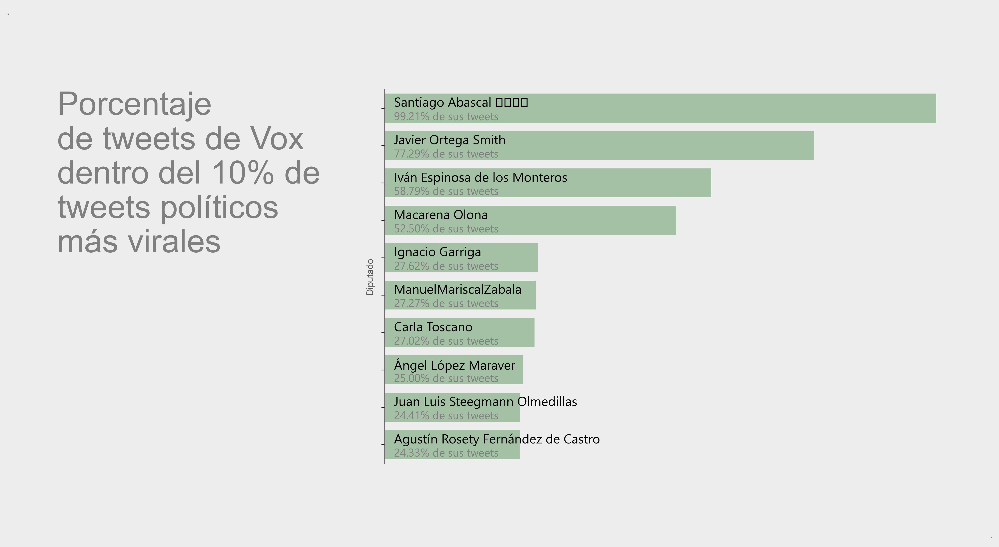

<Figure size 4500x2400 with 0 Axes>

In [412]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=300)
fig.set_size_inches(17, 6)

# Definimos axis
gs = GridSpec(1, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1:3])

# Título
axtitulo.text(0,0.565,'Porcentaje\nde tweets de Vox\ndentro del 10% de\ntweets políticos\nmás virales', size=35, color='grey')
axtitulo.text(-0.2,1.2,'.', size=12, color='grey')
axtitulo.text(3.7,-0.2,'.', size=12, color='grey')

axtitulo.axis('off')

# Ploting
top_twitters('Vox')

**Unidas Podemos**:

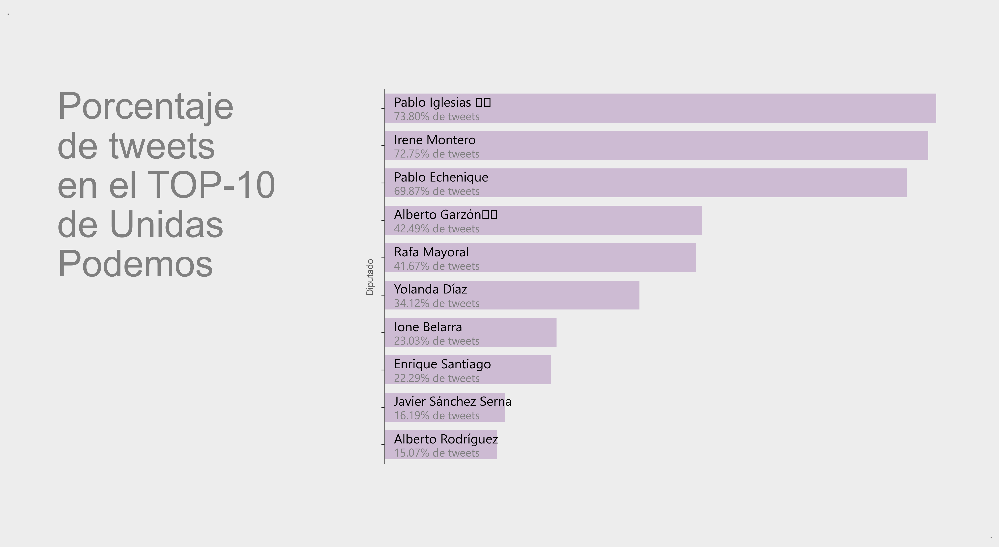

<Figure size 4500x2400 with 0 Axes>

In [141]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=300)
fig.set_size_inches(17, 6)

# Definimos axis
gs = GridSpec(1, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1:3])

# Título
axtitulo.text(0,0.5,'Porcentaje\nde tweets\nen el TOP-10\nde Unidas\nPodemos', size=40, color='grey')
axtitulo.text(-0.2,1.2,'.', size=12, color='grey')
axtitulo.text(3.7,-0.2,'.', size=12, color='grey')

axtitulo.axis('off')

# Ploting
top_twitters('Unidas Podemos')

**Ciudadanos**:

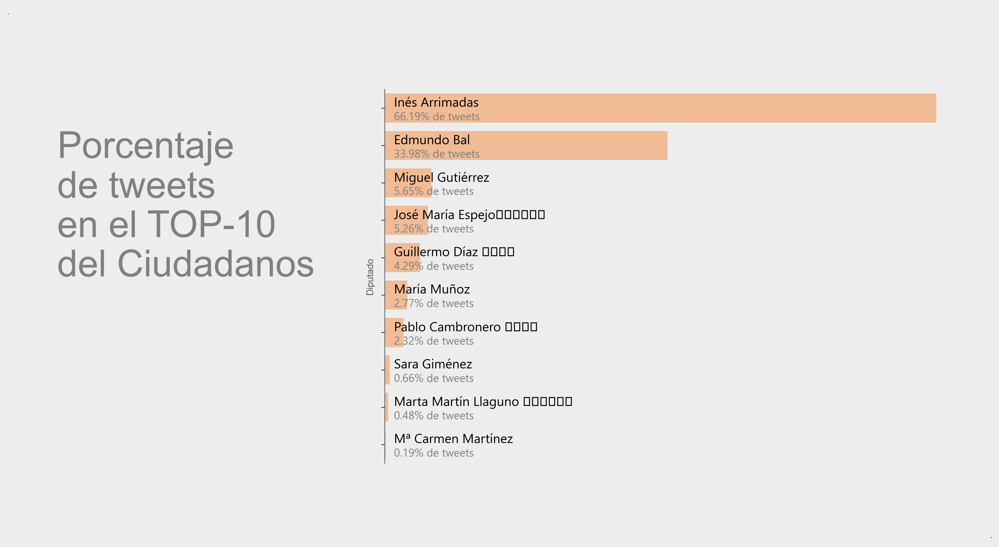

<Figure size 4500x2400 with 0 Axes>

In [142]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=300)
fig.set_size_inches(17, 6)

# Definimos axis
gs = GridSpec(1, 3, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, 0])
ax1 = fig.add_subplot(gs[0, 1:3])

# Título
axtitulo.text(0,0.5,'Porcentaje\nde tweets\nen el TOP-10\ndel Ciudadanos', size=40, color='grey')
axtitulo.text(-0.2,1.2,'.', size=12, color='grey')
axtitulo.text(3.7,-0.2,'.', size=12, color='grey')

axtitulo.axis('off')

# Ploting
top_twitters('Ciudadanos')

## 4. Análisis del lenguaje

In [511]:
df_text = tweetsdip.merge(df_text[['ID', 'VERB', 'ADV', 'ADJ', 'NOUN', 'PROPN']], on='ID')

In [534]:
df_text.head()

,ID,CREATED_AT,FULL_TEXT,IS_QUOTE,RETWEET_COUNT,FAVORITE_COUNT,POSSIBLE_SENSITIVE,IN_REPLY_TO_STATUS_ID,IN_REPLY_TO_USER_ID,IN_REPLY_TO_SCREEN_NAME,...,SEXO,EDAD,IS_TOP_TWEET,CREATED_AT_DWEEK,USER_NAME,VERB,ADV,ADJ,NOUN,PROPN
0,1319175784267976706,2020-10-22 07:16:30,📺En unos minutos seré entrevistado en @LaHoraT...,True,14,28,False,nan,nan,None,...,Hombre,61,False,3,José Luis Ábalos,[seguirlo],"[📺, aquí]",[entrevistar],[minuto],"[@lahoratve, puedes, https://t.co/5frfhxny4z, ..."
1,1318920807737937923,2020-10-21 14:23:19,.@sanchezcastejon a Casado:\nLe pido que no re...,False,164,292,False,nan,nan,None,...,Hombre,61,False,2,José Luis Ábalos,"[pedir, regalar, volver, tener, pedir, votar, ...","[no, nunca, formalmente, no]",[suficiente],"[éxito, ultraderecha, señor, #, mocióndecensur...","[casado, abascal, estado, pp, españapuedeconvo..."
2,1318904449784598532,2020-10-21 13:18:19,Usted odia a España tal y como es. A un patrio...,False,449,1044,False,nan,nan,None,...,Hombre,61,True,2,José Luis Ábalos,"[odiar, acomodar, sobrar, hablar]",[no],[limitar],"[patriota, mitad, españolar, número, prejuicio...","[españa, españa, lorca, machado, españapuedeco..."
3,1318878403680858112,2020-10-21 11:34:49,.@sanchezcastejon: La pandemia ha puesto a pru...,False,168,275,False,nan,nan,None,...,Hombre,61,False,2,José Luis Ábalos,"[poner, cerrar, construir, ocurrir, dejar]","[no, nadar, más]","[rico, territorial, compartir, patriótico, noble]","[pandemia, probar, diversidad, herir, futuro, ...","[#, mocióndecensura, #, españapuedeconvox, htt..."
4,1318819292087988224,2020-10-21 07:39:56,Hoy salen a la venta los billetes de la nueva ...,False,170,464,False,nan,nan,None,...,Hombre,61,False,2,José Luis Ábalos,"[llegar, https://t.co/swo1ibriyt]","[hoy, ya]","[nuevo, ferroviario, próximo, nuevo, alto, alto]","[venta, billete, conexión, incorporación, día,...","[madrid-galicia, zamora, pedralba, pradería, g..."


Llegados a este punto, vamos a separar dataframes en función de la tipología de palabra para poder analizarlas mejor a través de un one-hot-encoder.

In [541]:
df_text_verb = df_text.drop(['ADV', 'ADJ', 'NOUN', 'PROPN'], axis=1)
df_text_adv = df_text.drop(['VERB', 'ADJ', 'NOUN', 'PROPN'], axis=1)
df_text_adj = df_text.drop(['VERB', 'ADV', 'NOUN', 'PROPN'], axis=1)
df_text_noun = df_text.drop(['VERB', 'ADV', 'ADJ', 'PROPN'], axis=1)
df_text_propn = df_text.drop(['VERB', 'ADV', 'ADJ', 'NOUN'], axis=1)

In [542]:
df_text_verb.head()

,ID,CREATED_AT,FULL_TEXT,IS_QUOTE,RETWEET_COUNT,FAVORITE_COUNT,POSSIBLE_SENSITIVE,IN_REPLY_TO_STATUS_ID,IN_REPLY_TO_USER_ID,IN_REPLY_TO_SCREEN_NAME,...,CREATED_AT_DATE,CREATED_AT_HOUR,LISTA,NOMBRE_APELLIDOS,SEXO,EDAD,IS_TOP_TWEET,CREATED_AT_DWEEK,USER_NAME,VERB
0,1319175784267976706,2020-10-22 07:16:30,📺En unos minutos seré entrevistado en @LaHoraT...,True,14,28,False,nan,nan,None,...,2020-10-22,07:16:30,PSOE,José Luis Ábalos Meco,Hombre,61,False,3,José Luis Ábalos,[seguirlo]
1,1318920807737937923,2020-10-21 14:23:19,.@sanchezcastejon a Casado:\nLe pido que no re...,False,164,292,False,nan,nan,None,...,2020-10-21,14:23:19,PSOE,José Luis Ábalos Meco,Hombre,61,False,2,José Luis Ábalos,"[pedir, regalar, volver, tener, pedir, votar, ..."
2,1318904449784598532,2020-10-21 13:18:19,Usted odia a España tal y como es. A un patrio...,False,449,1044,False,nan,nan,None,...,2020-10-21,13:18:19,PSOE,José Luis Ábalos Meco,Hombre,61,True,2,José Luis Ábalos,"[odiar, acomodar, sobrar, hablar]"
3,1318878403680858112,2020-10-21 11:34:49,.@sanchezcastejon: La pandemia ha puesto a pru...,False,168,275,False,nan,nan,None,...,2020-10-21,11:34:49,PSOE,José Luis Ábalos Meco,Hombre,61,False,2,José Luis Ábalos,"[poner, cerrar, construir, ocurrir, dejar]"
4,1318819292087988224,2020-10-21 07:39:56,Hoy salen a la venta los billetes de la nueva ...,False,170,464,False,nan,nan,None,...,2020-10-21,07:39:56,PSOE,José Luis Ábalos Meco,Hombre,61,False,2,José Luis Ábalos,"[llegar, https://t.co/swo1ibriyt]"


In [543]:
# Definimos función para convertir a one-hot-encoding cada tipología

from sklearn.preprocessing import MultiLabelBinarizer

def one_hot_encoder(df, tipo_palabra):
    mlb = MultiLabelBinarizer(sparse_output=True)
    df = df.join(pd.DataFrame.sparse.from_spmatrix(mlb.fit_transform(df.pop(tipo_palabra)),
                                                    index=df.index,
                                                    columns=mlb.classes_))
    return df

# Transformamos dataframes
df_text_verb = one_hot_encoder(df_text_verb, 'VERB')
df_text_adv = one_hot_encoder(df_text_adv, 'ADV')
df_text_adj = one_hot_encoder(df_text_adj, 'ADJ')
df_text_noun = one_hot_encoder(df_text_noun, 'NOUN')
df_text_propn = one_hot_encoder(df_text_propn, 'PROPN')
    


In [523]:
# Acortamos el número de columnas a mostrar
pd.set_option('display.max_columns', 20)


In [556]:
# Filtramos las columnas que no sean palabras

def remove_non_noun(df):
    lista_columnas = df.columns[30:]
    with_s = [x for x in lista_columnas if not x.isalpha()]
    
    return df.drop(with_s, axis=1)

# Filtramos dataframes
df_text_verb = remove_non_noun(df_text_verb)
df_text_adv = remove_non_noun(df_text_adv)
df_text_adj = remove_non_noun(df_text_adj)
df_text_noun = remove_non_noun(df_text_noun)
df_text_propn = remove_non_noun(df_text_propn)

Agrupamos por dia y partido político:

Vamos a separar el dataframe en función de los datos que nos interese sacar, que serán los relativos al tipo de palabra, al grupo político y a si son antes o después del estado de alarma:

In [644]:
# Sacamos el número de semana para poder agrupar

def filtrar_df(df, ea, partido):
    if ea == True:
        return df.loc[(df['CREATED_AT_DATE'].dt.week<26) & (df['LISTA']==partido), :]
    else:
        return df.loc[(df['CREATED_AT_DATE'].dt.week>=26) & (df['LISTA']==partido), :]

In [645]:
# VERB
df_text_verb_psoe_ea = filtrar_df(df_text_verb, True, 'PSOE')
df_text_verb_pp_ea = filtrar_df(df_text_verb, True, 'PP')
df_text_verb_vox_ea = filtrar_df(df_text_verb, True, 'Vox')
df_text_verb_podemos_ea = filtrar_df(df_text_verb, True, 'Unidas Podemos')
df_text_verb_cs_ea = filtrar_df(df_text_verb, True, 'Ciudadanos')

# VERB
df_text_verb_psoe_postea = filtrar_df(df_text_verb, False, 'PSOE')
df_text_verb_pp_postea = filtrar_df(df_text_verb, False, 'PP')
df_text_verb_vox_postea = filtrar_df(df_text_verb, False, 'Vox')
df_text_verb_podemos_postea = filtrar_df(df_text_verb, False, 'Unidas Podemos')
df_text_verb_cs_postea = filtrar_df(df_text_verb, False, 'Ciudadanos')

# ADV
df_text_adv_psoe_ea = filtrar_df(df_text_adv, True, 'PSOE')
df_text_adv_pp_ea = filtrar_df(df_text_adv, True, 'PP')
df_text_adv_vox_ea = filtrar_df(df_text_adv, True, 'Vox')
df_text_adv_podemos_ea = filtrar_df(df_text_adv, True, 'Unidas Podemos')
df_text_adv_cs_ea = filtrar_df(df_text_adv, True, 'Ciudadanos')

df_text_adv_psoe_postea = filtrar_df(df_text_adv, False, 'PSOE')
df_text_adv_pp_postea = filtrar_df(df_text_adv, False, 'PP')
df_text_adv_vox_postea = filtrar_df(df_text_adv, False, 'Vox')
df_text_adv_podemos_postea = filtrar_df(df_text_adv, False, 'Unidas Podemos')
df_text_adv_cs_postea = filtrar_df(df_text_adv, False, 'Ciudadanos')

# ADJ
df_text_adj_psoe_ea = filtrar_df(df_text_adj, True, 'PSOE')
df_text_adj_pp_ea = filtrar_df(df_text_adj, True, 'PP')
df_text_adj_vox_ea = filtrar_df(df_text_adj, True, 'Vox')
df_text_adj_podemos_ea = filtrar_df(df_text_adj, True, 'Unidas Podemos')
df_text_adj_cs_ea = filtrar_df(df_text_adj, True, 'Ciudadanos')

df_text_adj_psoe_postea = filtrar_df(df_text_adj, False, 'PSOE')
df_text_adj_pp_postea = filtrar_df(df_text_adj, False, 'PP')
df_text_adj_vox_postea = filtrar_df(df_text_adj, False, 'Vox')
df_text_adj_podemos_postea = filtrar_df(df_text_adj, False, 'Unidas Podemos')
df_text_adj_cs_postea = filtrar_df(df_text_adj, False, 'Ciudadanos')

# NOUN
df_text_noun_psoe_ea = filtrar_df(df_text_noun, True, 'PSOE')
df_text_noun_pp_ea = filtrar_df(df_text_noun, True, 'PP')
df_text_noun_vox_ea = filtrar_df(df_text_noun, True, 'Vox')
df_text_noun_podemos_ea = filtrar_df(df_text_noun, True, 'Unidas Podemos')
df_text_noun_cs_ea = filtrar_df(df_text_noun, True, 'Ciudadanos')

df_text_noun_psoe_postea = filtrar_df(df_text_noun, False, 'PSOE')
df_text_noun_pp_postea = filtrar_df(df_text_noun, False, 'PP')
df_text_noun_vox_postea = filtrar_df(df_text_noun, False, 'Vox')
df_text_noun_podemos_postea = filtrar_df(df_text_noun, False, 'Unidas Podemos')
df_text_noun_cs_postea = filtrar_df(df_text_noun, False, 'Ciudadanos')

# PROPN
df_text_propn_psoe_ea = filtrar_df(df_text_propn, True, 'PSOE')
df_text_propn_pp_ea = filtrar_df(df_text_propn, True, 'PP')
df_text_propn_vox_ea = filtrar_df(df_text_propn, True, 'Vox')
df_text_propn_podemos_ea = filtrar_df(df_text_propn, True, 'Unidas Podemos')
df_text_propn_cs_ea = filtrar_df(df_text_propn, True, 'Ciudadanos')

df_text_propn_psoe_postea = filtrar_df(df_text_propn, False, 'PSOE')
df_text_propn_pp_postea = filtrar_df(df_text_propn, False, 'PP')
df_text_propn_vox_postea = filtrar_df(df_text_propn, False, 'Vox')
df_text_propn_podemos_postea = filtrar_df(df_text_propn, False, 'Unidas Podemos')
df_text_propn_cs_postea = filtrar_df(df_text_propn, False, 'Ciudadanos')

Agrupamos según tipo de palabra:

In [911]:
def df_to_dict(df):
    dicc = {}
    df_cols = df.columns[30:]
    for i in df_cols:
        try:
            dicc[i] = df[i].sparse.to_dense().sum()
        except KeyError:
            pass
    return {k: dicc[k] for k in sorted(dicc, key=dicc.get, reverse=True)}

def transform_df(lista_df):
    
    
    # Transformamos primero en diccionario sumando valores
    lista_dicc = [df_to_dict(x) for x in lista_df]

    #df = df_to_dict(df)
    
    # Volvemos a construir el dataframe
    returning_df = pd.DataFrame.from_dict(lista_dicc).T
    
    # Eliminamos los valores con cero resultados
    returning_df = returning_df.loc[(returning_df!=0).any(axis=1)].T
    
    # Modificamos algunas palabras para darle más sentido
    trans_word = {'españolar': 'españa', 'izquierdo': 'izquierda', 'libertar': 'libertad'}
    for k, v in trans_word.items():
        try:
            returning_df = returning_df.rename(columns={k: v})
        except KeyError:
            continue
    
    # Lista de palabras para eliminar
    drop_words = ['ser', 'tener', 'hacer', 'haber', 'estar', 'más', 'ya', 'muy', 'día', 'año', 'vez']
    for word in drop_words:       
        try:
            returning_df.drop([word], 1, inplace=True)
        except KeyError:
            continue
    
    # Agrupamos palabras, sumamos y devolvemos las 20 primeras
    return returning_df.sum().sort_values(ascending=False)
    

In [907]:
trans_word = {'españolar': 'españa', 'izquierdo': 'izquierda', 'libertar': 'libertad'}
for k, v in trans_word.items():
    print(k, v)

españolar españa
izquierdo izquierda
libertar libertad


In [820]:
transform_df([df_text_adj_psoe_postea,
             df_text_noun_psoe_postea])

país         746.00
año          730.00
político     674.00
derecho      569.00
día          536.00
nuevo        515.00
social       490.00
gran         485.00
mujer        461.00
pandemia     446.00
partir       406.00
personar     405.00
público      391.00
democracia   383.00
medir        381.00
trabajar     371.00
vida         353.00
millón       322.00
futuro       313.00
gobernar     307.00
acordar      291.00
crisis       287.00
vez          286.00
económico    280.00
climático    274.00
presidente   269.00
salud        269.00
sanitario    265.00
bueno        263.00
españolar    262.00
tiempo       261.00
cambiar      259.00
mundo        252.00
grande       252.00
compañero    245.00
compromiso   245.00
sociedad     242.00
necesario    235.00
problema     235.00
familia      234.00
momento      228.00
mejor        226.00
apoyar       222.00
situación    218.00
luchar       215.00
ciudadanía   211.00
ley          210.00
violencia    208.00
importante   208.00
víctima      203.00


Guardamos la lista de palabras de cada grupo. Decidimos emplear solamente adjetivos y sustantivos para reducir ruido y tener una perspectiva más clara. Con más tiempo y recursos podríamos profundizar más, pero lo dejaremos para el futuro.

In [912]:
df_psoe_ea = transform_df([df_text_adj_psoe_ea, df_text_noun_psoe_ea])
df_pp_ea = transform_df([df_text_adj_pp_ea, df_text_noun_pp_ea])
df_vox_ea = transform_df([df_text_adj_vox_ea, df_text_noun_vox_ea])
df_podemos_ea = transform_df([df_text_adj_podemos_ea, df_text_noun_podemos_ea])
df_cs_ea = transform_df([df_text_adj_cs_ea, df_text_noun_cs_ea])

df_psoe_postea = transform_df([df_text_adj_psoe_postea, df_text_noun_psoe_postea])
df_pp_postea = transform_df([df_text_adj_pp_postea, df_text_noun_pp_postea])
df_vox_postea = transform_df([df_text_adj_vox_postea, df_text_noun_vox_postea])
df_podemos_postea = transform_df([df_text_adj_podemos_postea, df_text_noun_podemos_postea])
df_cs_postea = transform_df([df_text_adj_cs_postea, df_text_noun_cs_postea])

Ya tenemos la lista, ahora vamos a plotearla!

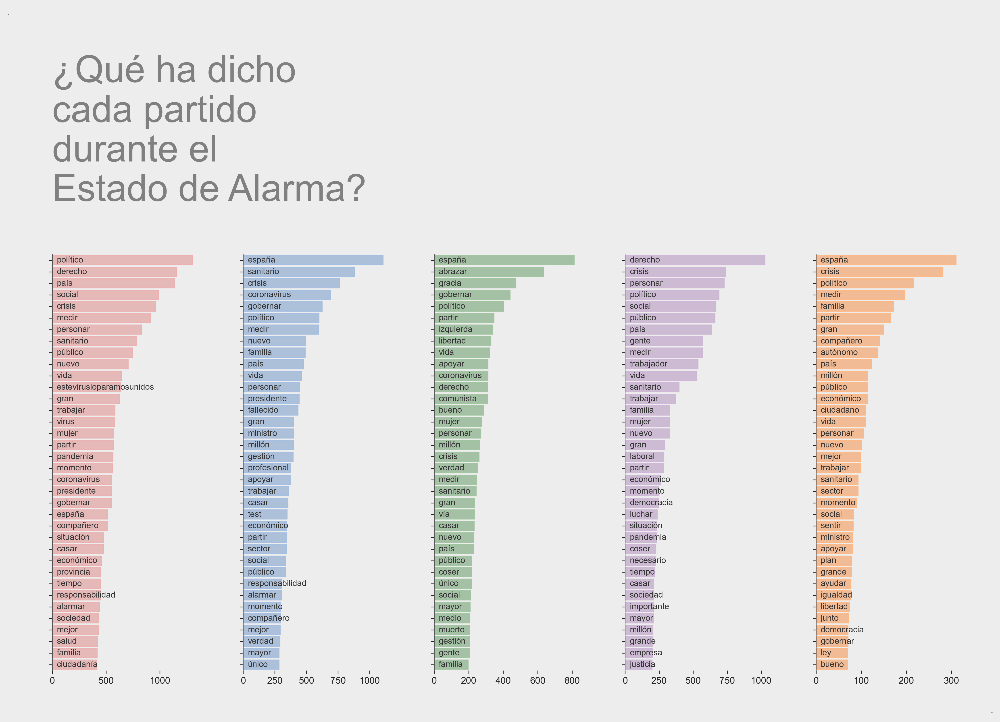

In [916]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=300)
fig.set_size_inches(17, 8)

# Definimos axis
gs = GridSpec(6, 5, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, :])
ax1 = fig.add_subplot(gs[1:6, 0])
ax2 = fig.add_subplot(gs[1:6, 1])
ax3 = fig.add_subplot(gs[1:6, 2])
ax4 = fig.add_subplot(gs[1:6, 3])
ax5 = fig.add_subplot(gs[1:6, 4])

# Título
axtitulo.text(0,0.6,'¿Qué ha dicho\ncada partido\ndurante el\nEstado de Alarma?', size=40, color='grey')
axtitulo.text(-0.05,3,'.', size=12, color='grey')
axtitulo.text(1.03,-6,'.', size=12, color='grey')

axtitulo.axis('off')

# Plots
lista_datos = [df_psoe_ea, df_pp_ea, df_vox_ea, df_podemos_ea, df_cs_ea]
lista_colores = ['#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986']
lista_axes = [ax1, ax2, ax3, ax4, ax5]

for i, lista in enumerate(lista_datos):
    ax = lista_axes[i]
    barplot = sns.barplot(y=lista[:36].index, x=lista[:36].values, orient='h',
                          color=lista_colores[i], ax=ax, edgecolor=lista_colores[i])
    
    for index, barra in enumerate(barplot.patches):
        #print(barra)
        barplot.annotate(lista[:36].index[index], 
                       (barra.get_x(), barra.get_y()), 
                       ha = 'left', va = 'center', c='#333333',
                       size=9,
                       xytext = (5, -5), 
                       textcoords = 'offset points')
        
    ax.set_yticklabels(labels='')

    sns.despine(ax=ax, bottom=True)

    

Veamos ahora si hay diferencias de argumento tras el fin del estado de alarma:

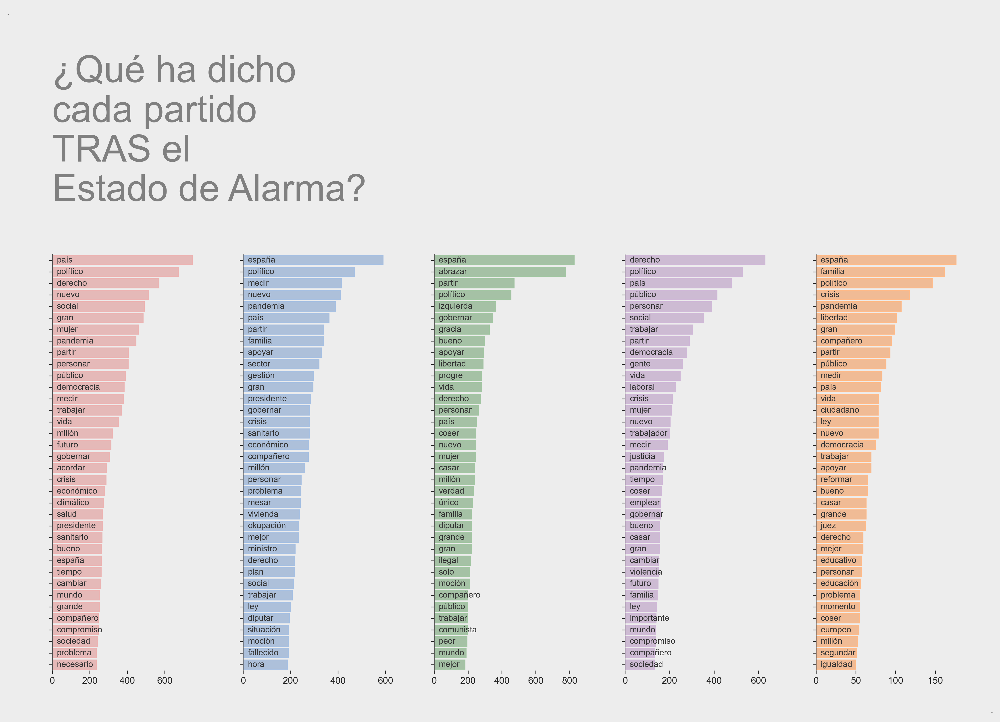

In [917]:
# Creamos figura
fig = plt.figure(constrained_layout=False, dpi=300)
fig.set_size_inches(17, 8)

# Definimos axis
gs = GridSpec(6, 5, figure=fig)#, hspace=10.4,wspace=10.1)
gs.update(left=10.1,right=10.9,top=0.965,bottom=0.03,wspace=0.3,hspace=0.09)

# Definimos cuadrícula
axtitulo = fig.add_subplot(gs[0, :])
ax1 = fig.add_subplot(gs[1:6, 0])
ax2 = fig.add_subplot(gs[1:6, 1])
ax3 = fig.add_subplot(gs[1:6, 2])
ax4 = fig.add_subplot(gs[1:6, 3])
ax5 = fig.add_subplot(gs[1:6, 4])

# Título
axtitulo.text(0,0.6,'¿Qué ha dicho\ncada partido\nTRAS el\nEstado de Alarma?', size=40, color='grey')
axtitulo.text(-0.05,3,'.', size=12, color='grey')
axtitulo.text(1.03,-6,'.', size=12, color='grey')

axtitulo.axis('off')

# Plots
lista_datos = [df_psoe_postea, df_pp_postea, df_vox_postea, df_podemos_postea, df_cs_postea]
lista_colores = ['#ecb2b1', '#a5bfe2', '#a1c5a1', '#cfb7d7', '#ffb986']
lista_axes = [ax1, ax2, ax3, ax4, ax5]

for i, lista in enumerate(lista_datos):
    ax = lista_axes[i]
    barplot = sns.barplot(y=lista[:36].index, x=lista[:36].values, orient='h',
                          color=lista_colores[i], ax=ax, edgecolor=lista_colores[i])
    
    for index, barra in enumerate(barplot.patches):
        #print(barra)
        barplot.annotate(lista[:36].index[index], 
                       (barra.get_x(), barra.get_y()), 
                       ha = 'left', va = 'center', c='#333333',
                       size=9,
                       xytext = (5, -5), 
                       textcoords = 'offset points')
        
    ax.set_yticklabels(labels='')
    sns.despine(ax=ax, bottom=True)

    

No existen grandes diferencias, por tanto, rechazamos la hipótesis de que el argumento de cada partido ha cambiado según su papel en la gestión de la pandemia.

#### Analizando el sentimiento de cada tweet

**Este apartado no está completo y se actualizará en breve**

Para este análisis vamos a servirnos de TensorFlow y de la librería 'Transformer', que nos permitirá analizar el sentimiento de cada tweet a través de paquetes que pueden incorporarse a la herramienta. En concreto emplearemos un modelo ya entrenado de 'bert-base-multilingual-uncased-sentiment', que nos arroja un accuracy del 95% en tweets en español.

In [1127]:
from transformers import AutoTokenizer, AutoModelForSequenceClassification

tokenizer = AutoTokenizer.from_pretrained("nlptown/bert-base-multilingual-uncased-sentiment")

model = AutoModelForSequenceClassification.from_pretrained("nlptown/bert-base-multilingual-uncased-sentiment")

In [1140]:
import torch
import numpy as np

text = """
Esto no es bueno, pero esto no es malo. Es regular
"""

inputs = tokenizer(text, return_tensors="pt")
outputs = model(**inputs)


tot = []
valor = [1,1,1,1,1]
for i, output in enumerate(outputs[0][0]):
    tot.append(float(output)*valor[i])

print(tot)
media = sum(tot)/5
print('Media', media)
print('Desviación:', np.std(tot))

pos = tot.index(max(tot))
valoraciones = {0: 0.00, 1:0.25, 2:0.5, 3:0.75, 4:1}

# Cojo los valores superiores a 0
varx = [x for x in tot if x>0]
#print(tot.index)
varx_index = [tot.index(x) for x in varx]
media = sum(varx)/len(varx)
print('Media val probables', sum(varx)/len(varx))
print(varx)
print(varx_index)
vals = [valoraciones[x] for x in varx_index]
print('Vals:', vals)
vals[0]

#pos_corregida = ( (media - varx[0]) / (varx[-1] - varx[0]) ) * (max(vals)-min(vals))
pos_corregida = ( (media - min(varx)) / (max(varx) - min(varx) ) ) * (max(vals)-min(vals)) + (min(vals))

print('El tweet tiene positivismo del {:.2f}%'.format(valoraciones[pos]))
print('El tweet tiene positivismo del {:.5f}%'.format(pos_corregida))

[0.124699667096138, 1.8618168830871582, 2.274595022201538, -0.5253502726554871, -2.9505343437194824]
Media 0.15704539120197297
Desviación: 1.8715781670079792
Media val probables 1.420370524128278
[0.124699667096138, 1.8618168830871582, 2.274595022201538]
[0, 1, 2]
Vals: [0.0, 0.25, 0.5]
El tweet tiene positivismo del 0.50%
El tweet tiene positivismo del 0.30133%


## 4. Conclusiones

Aún a falta de analizar la totalidad de variables (quedaron atrás hashtags, emojis, respuestas, etc), podemos sacar algunas conclusiones:
- **Diferencias entre grupos políticos tradicionales y nuevos partidos:** No tanto a nivel de media de tweets, sino al momento de escribirlos. Diferencias claras entre el número de seguidores de los diputados de cada uno de estos grupos y del nivel de viralización de sus tweets. Vox y Unidas Podemos consiguen unos niveles de engagement muy superiores al resto.
- **El 99% de los tweets escritos por Santiago Abascal están dentro del top 10** de los más retwitteados, lo que no ocurre con ningún otro lider. Todo lo que publica se convierte en viral
- **Aunque Vox multiplicase su presencia en twitter, su número de retweets y likes ha ido descendiendo.** Ocurre lo mismo con los demás partidos salvo con Ciudadanos, PSOE y UP, que muestran una ligera recuperación.
- **Sin diferencias significativas en el argumentario** durante el Estado y Alarma y post Estado de Alarma en los grupos políticos, aunque si se notan ligeras diferencias.
- **El Partido Popular** es el único partido donde su (hasta entonces) portavoz, tenía más viralidad en Twitter que el mismo líder.
- **Los partidos 'tradicionales' PP y PSOE** la correlación entre volumen de tweets y contagios/fallecidos por la COVID-19 ha sido cercana al 1.
- **Ciudadanos** es el único partido con la correlación negativa entre pandemia y número de tweets.
- **El domingo es el día con menos uso de twitter** salvo para Vox, que es su segundo día con más presencia.
- **Pre-pandemia, el porcentaje de tweets iba en consonancia al número de diputados**, tras el pico de fallecimientos de principios de abril, la presencia en twitter de Vox se triplica llegando a sumar más tweets que PSOE y PP juntos siendo 3 veces menos diputados.
- **Santiago Abascal es el líder en cuanto a RT** con una media de casi 4000 RT por tweet, frente al segundo, Pablo Iglesias, con una media de 1.700. Pese a tener Iglesias más de 5 veces el número de followers que Abascal, 2.400.000 millones frente a 500.000.